In [1]:
!which pip

/data/serrano/miniconda3/infinity_env/bin/pip


In [2]:
import airfrans as af
import matplotlib.pyplot as plt
from omegaconf import DictConfig, OmegaConf
import torch
#import tinycudann as tcnn

In [3]:
print('toto')

toto


In [4]:
PATH_TO_DATASET = "/data/serrano/airfrans/Dataset/"

In [5]:
pos_max = torch.Tensor([5, 2])
pos_min = torch.Tensor([-3, -2])

In [6]:
import numpy as np

In [7]:
import torch

In [8]:
key_to_index = {
    "x": 0,
    "y": 1,
    "inlet_x": 2,
    "inlet_y": 3,
    "sdf": 4,
    "nx": 5,
    "ny": 6,
    "vx": 7,
    "vy": 8,
    "p": 9,
    "nu":10,
}

In [9]:
import os
import sys
from pathlib import Path
sys.path.append("/home/serrano/Projects/INR_domain_decomposition/")

from infinity.utils.load_inr import load_inr_model
from infinity.utils.load_modulations import load_modulations

from infinity.data.dataset import GeometryDatasetFull, set_seed
from infinity.mlp import ResNet
from torch_geometric.loader import DataLoader
from infinity.graph_metalearning import outer_step
from infinity.ddpm import DDPM

import einops
import json
import numpy as np
import torch
import torch.nn as nn

import yaml
from omegaconf import DictConfig

# 1. Load pressure results

In [10]:
task = "full"
data_to_encode = None
latent_dim = 256
scale_factor=1

In [11]:
data_dir = '/data/serrano/airfrans/'
print('data_dir', data_dir)

# train
with open(Path(data_dir) / 'Dataset/manifest.json', 'r') as f:
    manifest = json.load(f)

manifest_train = manifest[task + '_train']
testset = manifest[task + '_test'] if task != 'scarce' else manifest['full_test']
#n = int(.9*len(manifest_train))

#print("len manifest train", manifest_train, n)

#trainset = manifest_train[:n] # was [:-n] ???
#valset = manifest_train[n:]

ntrain = len(manifest_train)
ntest = len(testset)

#default sample is none
trainset = GeometryDatasetFull(manifest_train, key=data_to_encode, latent_dim=latent_dim, scale_factor=scale_factor, norm=True, sample="mesh", n_boot=4000)
print("loaded train")
testset = GeometryDatasetFull(testset, key=data_to_encode, latent_dim=latent_dim, scale_factor=scale_factor, sample="mesh", n_boot=4000, coef_norm=trainset.coef_norm)
    

data_dir /data/serrano/airfrans/


100%|███████████████████████████████████████████████████████████████████████████████████████| 800/800 [04:55<00:00,  2.71it/s]


coef_norm (array([ 5.0064105e-01,  1.1181436e-02,  6.1606461e+01,  4.8862386e+00,
        2.3173042e-01, -1.6572434e-03, -8.5309672e-05], dtype=float32), array([ 0.7040743 ,  0.33643225, 17.757267  ,  6.2838936 ,  0.47521183,
        0.04159059,  0.06237248], dtype=float32), array([ 4.2485832e+01,  9.7596407e+00, -4.5211685e+02,  7.9553854e-04],
      dtype=float32), array([2.9667524e+01, 3.0894947e+01, 2.9469661e+03, 2.9265855e-03],
      dtype=float32))
loaded train


100%|███████████████████████████████████████████████████████████████████████████████████████| 200/200 [01:10<00:00,  2.84it/s]


coef_norm (array([ 5.0064105e-01,  1.1181436e-02,  6.1606461e+01,  4.8862386e+00,
        2.3173042e-01, -1.6572434e-03, -8.5309672e-05], dtype=float32), array([ 0.7040743 ,  0.33643225, 17.757267  ,  6.2838936 ,  0.47521183,
        0.04159059,  0.06237248], dtype=float32), array([ 4.2485832e+01,  9.7596407e+00, -4.5211685e+02,  7.9553854e-04],
      dtype=float32), array([2.9667524e+01, 3.0894947e+01, 2.9469661e+03, 2.9265855e-03],
      dtype=float32))


In [12]:
trainset.normalize_coordinate=False
testset.normalize_coordinate=False

In [13]:
trainset.n_points = 64000
testset.n_points = 64000

In [14]:
import torch.nn.functional as F

In [15]:
with open('../config/regression.yaml', 'r') as f:
    cfg = yaml.safe_load(f)
cfg = DictConfig(cfg)

In [16]:
data_dir = cfg.data.dir
task = cfg.data.task
data_to_encode = cfg.data.data_to_encode
score = cfg.data.score
ntrain = cfg.data.ntrain
ntest = cfg.data.ntest
seed = cfg.data.seed

# optim
batch_size = cfg.optim.batch_size
batch_size_val = (
    batch_size if cfg.optim.batch_size_val == None else cfg.optim.batch_size_val
)
epochs = cfg.optim.epochs
lr = cfg.optim.lr
weight_decay = cfg.optim.weight_decay

# inr
#run_name_vx = cfg.inr.run_dict.vx  # "bright-totem-286"
#run_name_vy = cfg.inr.run_dict.vy  # "devoted-puddle-287"
#run_name_p = cfg.inr.run_dict.p  # "serene-vortex-284"
#run_name_nu = cfg.inr.run_dict.nu  # "wandering-bee-288"
#run_name_sdf = cfg.inr.run_dict.sdf  # "earnest-paper-289"
#run_name_n = cfg.inr.run_dict.n  # "astral-leaf-330"

run_name_vx="crisp-disco-451"
run_name_vy="leafy-lion-452"
run_name_p="woven-mountain-453"
run_name_nu="pleasant-gorge-454"
run_name_sdf="dutiful-smoke-468"
run_name_n="soft-leaf-471"
run_name_fields = "mild-sound-698"

# model
model_type = cfg.model.model_type
depth = cfg.model.depth
width = cfg.model.width
activation = cfg.model.activation

# 1. Load modulations

In [141]:
LOAD_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "inr"
RESULTS_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "model"
MODULATIONS_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "modulations"


In [142]:
tmp = torch.load(LOAD_DIR / "all_physics_fields" / f"{run_name_fields}.pt")
latent_dim = tmp["cfg"].inr.latent_dim

In [143]:

inr_fields, alpha_fields = load_inr_model(
    LOAD_DIR / "all_physics_fields", run_name_fields, input_dim=3, output_dim=4
)

inr_sdf, alpha_sdf = load_inr_model(
    LOAD_DIR / "sdf", run_name_sdf, input_dim=2, output_dim=1
)
inr_n, alpha_n = load_inr_model(
    LOAD_DIR / "n", run_name_n, input_dim=2, output_dim=2
)

mod_fields = load_modulations(
    trainset, testset, inr_fields, MODULATIONS_DIR, run_name_fields, "all_physics_fields", alpha=alpha_fields
)

mod_sdf = load_modulations(
    trainset,
    testset,
    inr_sdf,
    MODULATIONS_DIR,
    run_name_sdf,
    "sdf",
    alpha=alpha_sdf,
    input_dim=2,
)
mod_n = load_modulations(
    trainset,
    testset,
    inr_n,
    MODULATIONS_DIR,
    run_name_n,
    "n",
    alpha=alpha_n,
    input_dim=2,
)

In [399]:
gamma = 5

mu_fields = mod_fields["z_train"].mean(0)
sigma_fields = mod_fields["z_train"].std(0) * gamma

mu_sdf = mod_sdf["z_train"].mean(0)
sigma_sdf = mod_sdf["z_train"].std(0)

mu_n = mod_n["z_train"].mean(0)
sigma_n = mod_n["z_train"].std(0)


trainset.out_modulations["fields"] = (mod_fields["z_train"] - mu_fields) / sigma_fields

trainset.in_modulations["sdf"] = (mod_sdf["z_train"] - mu_sdf) / sigma_sdf
trainset.in_modulations["n"] = (mod_n["z_train"] - mu_n) / sigma_n

testset.out_modulations["fields"] = (mod_fields["z_test"] - mu_fields) / sigma_fields

testset.in_modulations["sdf"] = (mod_sdf["z_test"] - mu_sdf) / sigma_sdf
testset.in_modulations["n"] = (mod_n["z_test"] - mu_n) / sigma_n

In [400]:
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
# test
test_loader = DataLoader(testset, batch_size=batch_size_val, shuffle=True)

# 2. Load DDPM weights 

In [384]:
T = 500
beta = np.linspace(1e-4, 0.02, T)
alpha = 1 - beta
alpha_bar = torch.Tensor(np.cumprod(alpha))

ddpm = DDPM(in_channels=latent_dim,
             embed_channels=512,
             hidden_channels=512,
             out_channels=latent_dim,
             depth=3).cuda()

In [1026]:
run_name_ddpm = "logical-sun-1172" #"dutiful-wildflower-1154" #"lunar-pyramid-1156" #"dutiful-wildflower-1154"#"trim-bird-1152"# #"worldly-dawn-1150" #"comfy-frog-1148" #"resilient-vortex-1143"
path = f"/data/serrano/functa2functa/airfrans/{task}/model/{run_name_ddpm}.pt"
ddpm_input = torch.load(path)
ddpm.load_state_dict(ddpm_input['model'])
ddpm.eval()

DDPM(
  (embedding): SinusoidalPosEmb()
  (lift): Linear(in_features=256, out_features=512, bias=True)
  (project): Linear(in_features=512, out_features=256, bias=True)
  (activation): SiLU()
  (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (residual_blocks): ModuleList(
    (0-2): 3 x ResMLPBlock(
      (linear1): Linear(in_features=512, out_features=512, bias=True)
      (linear2): Linear(in_features=512, out_features=512, bias=True)
      (linear0): Linear(in_features=512, out_features=512, bias=True)
      (activation): SiLU()
      (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (layer_norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.3, inplace=False)
    )
  )
)

In [200]:
mu_fields = mu_fields.cuda()
sigma_fields = sigma_fields.cuda()

In [201]:
def sample_ddpm(model, alpha, beta, alpha_bar, z_dim=256, steps=500, total_steps=500):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.linspace(0, 1, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(1).cuda()
        else:
            eps = 0
            
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*model(z, time)) + torch.sqrt(beta[t])*eps
        
        # because of the mistake
        
        
        #z = (alpha[t])**(-0.5)*(z - (1-alpha[t])/(1-alpha_bar[t])*model(z, time) ) + beta[t]*eps

        
    return z

In [202]:
alpha = torch.Tensor(alpha)
beta = torch.Tensor(beta)
alpha_bar = torch.Tensor(alpha_bar)

In [203]:
z_sample = sample_ddpm(model, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=500)

In [204]:
z_sample = z_sample.squeeze().detach().cpu()

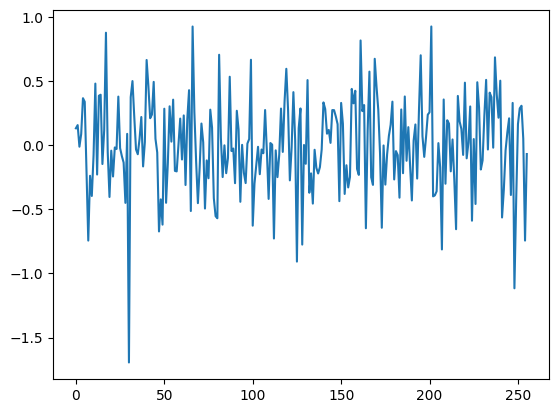

In [205]:
plt.plot(z_sample)

In [206]:
trainset.n_points=64000

In [207]:
graph, idx = trainset.get(20)

In [208]:
z_sample = sample_ddpm(model, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=500)

In [209]:
mean_sdf = trainset.coef_norm[0][4]
std_sdf = trainset.coef_norm[1][4]

In [210]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )

In [211]:
pred.shape

torch.Size([64000, 4])

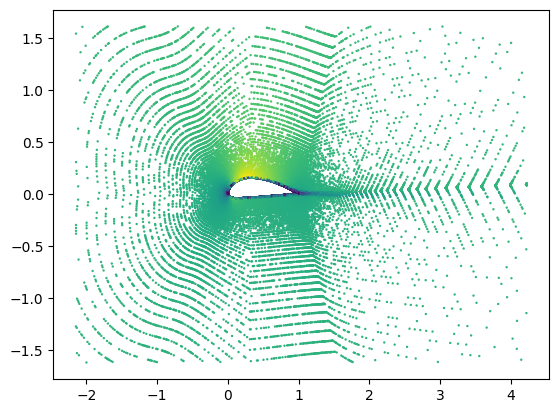

In [212]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)

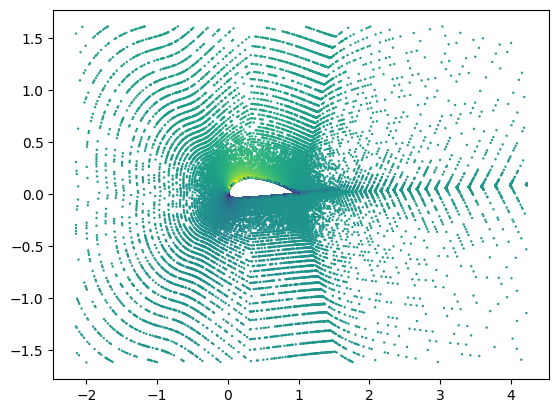

In [213]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 0].cpu().detach(), s=0.5)

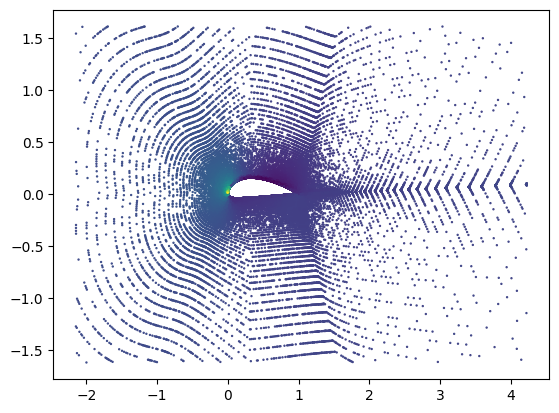

In [214]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 1].cpu().detach(), s=0.5)

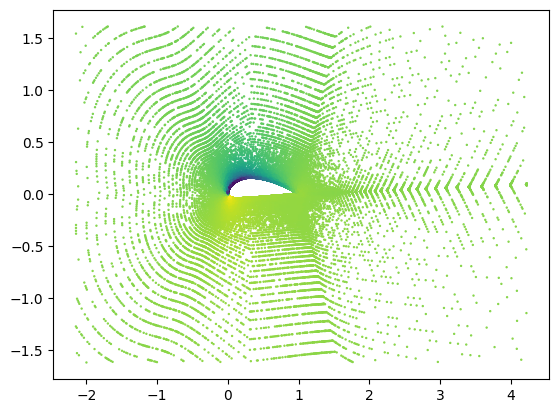

In [215]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 2].cpu().detach(), s=0.5)

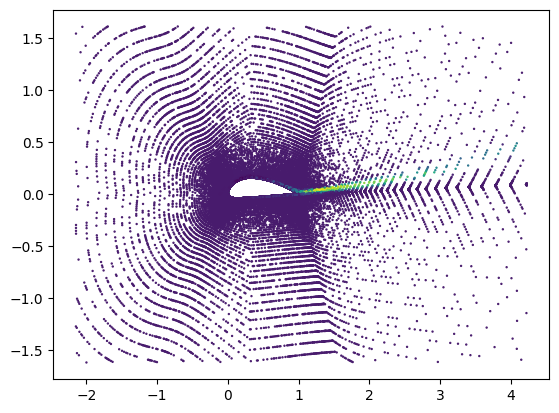

In [216]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 3].cpu().detach(), s=0.5)

In [217]:
num_samples = 100
z_dist = torch.zeros(num_samples, 256)
pred_dist = torch.zeros(num_samples, 64000, 4)

graph, idx = trainset.get(30)

for i in range(num_samples):
    z_sample = sample_ddpm(model, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=500)
    z_dist[i] = z_sample.cpu().detach()
    with torch.no_grad():
        graph = graph.cuda()
        pos = torch.cat([graph.pos, graph.sdf], axis=-1)
        pred = inr_fields.modulated_forward(
            pos, z_sample * sigma_fields + mu_fields
        )
        pred_dist[i] = pred.cpu().detach()
    

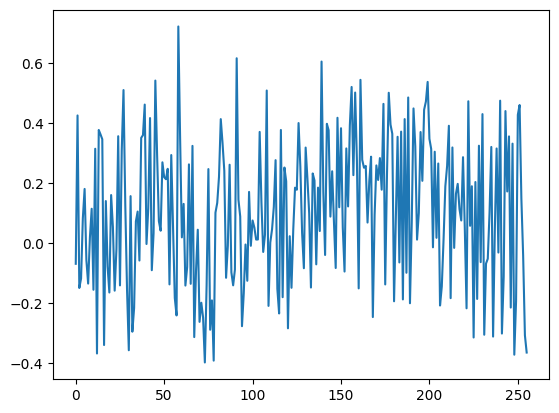

In [218]:
plt.plot(z_dist.mean(0))

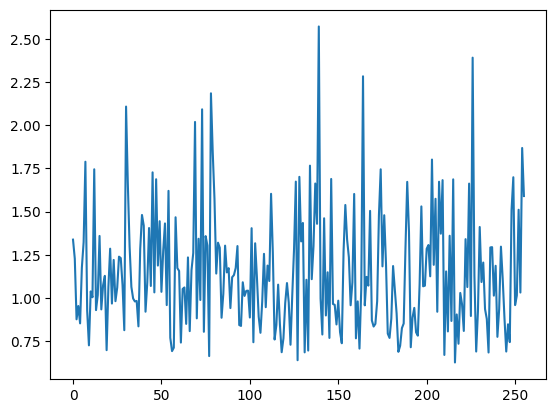

In [219]:
plt.plot(z_dist.std(0))

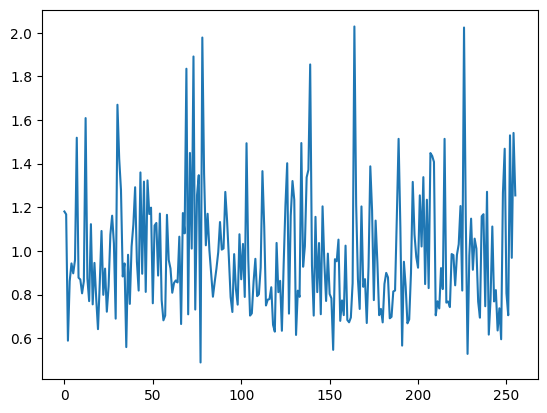

In [189]:
plt.plot(z_dist.std(0))

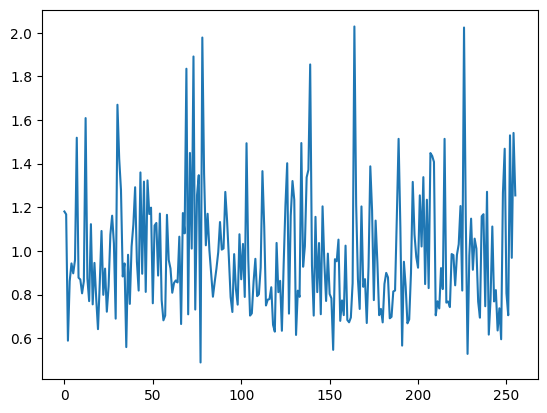

In [190]:
plt.plot(z_dist.std(0))

In [191]:
pred_mean = pred_dist.mean(0)

In [192]:
pred_std = pred_dist.std(0)

In [193]:
pred_std

tensor([[1.0805, 0.1099, 0.4221, 0.4509],
        [0.8845, 0.1038, 0.0648, 0.0534],
        [0.8377, 0.6164, 0.2161, 0.0595],
        ...,
        [0.4886, 1.4432, 1.0415, 0.0560],
        [0.8650, 0.0924, 0.0829, 0.2768],
        [0.8277, 1.5831, 1.4999, 0.0733]])

In [194]:
pred_mean

tensor([[ 1.0406, -0.3919, -0.4492,  0.1617],
        [ 0.4298, -0.2086,  0.2164, -0.2652],
        [ 0.4088,  0.5157,  0.0604, -0.2698],
        ...,
        [-0.7821,  1.3443, -0.1134, -0.2681],
        [ 0.4068, -0.2361,  0.2292, -0.2374],
        [-0.4765,  1.8034, -0.6276, -0.2663]])

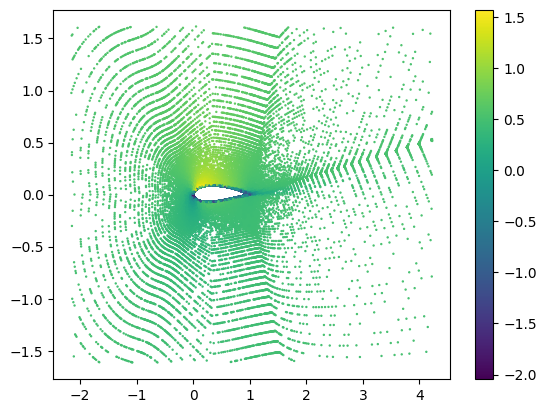

In [195]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_mean[..., 0].cpu().detach(), s=0.5)
plt.colorbar()

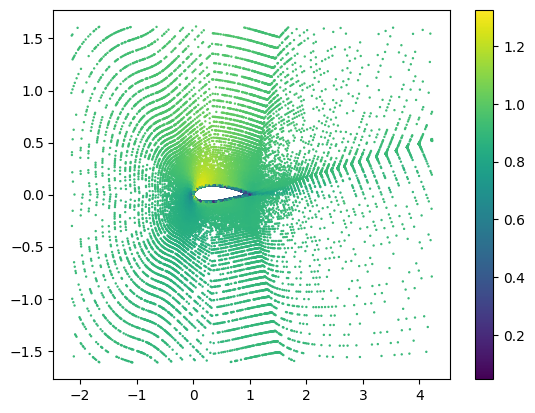

In [196]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_std[..., 0].cpu().detach(), s=0.5)
plt.colorbar()

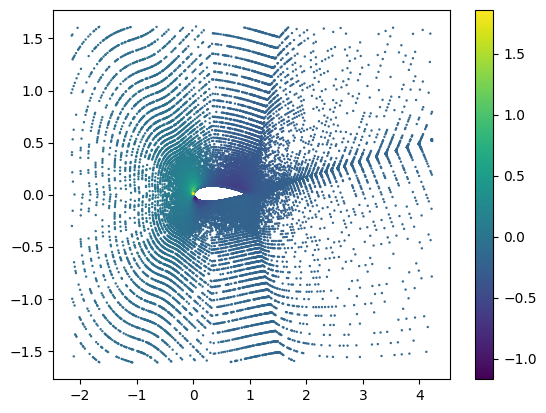

In [197]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_mean[..., 1].cpu().detach(), s=0.5)
plt.colorbar()

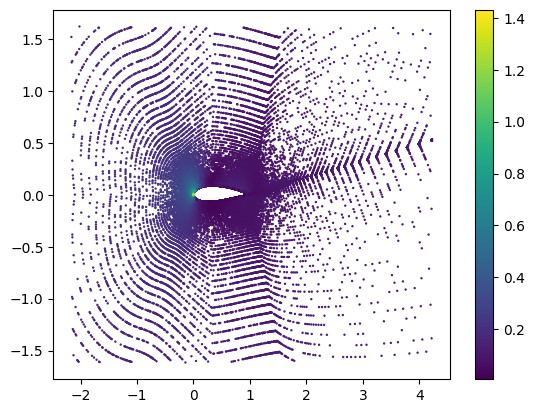

In [86]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_std[..., 1].cpu().detach(), s=0.5)
plt.colorbar()

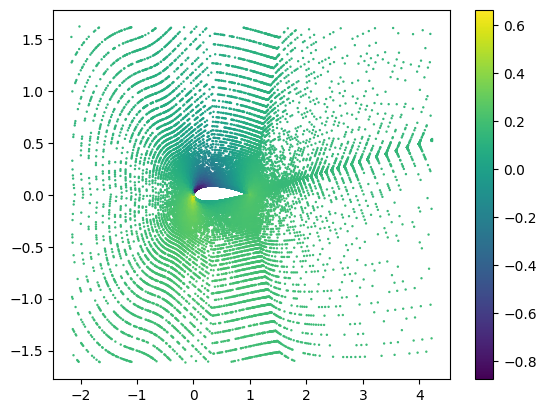

In [87]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_mean[..., 2].cpu().detach(), s=0.5)
plt.colorbar()

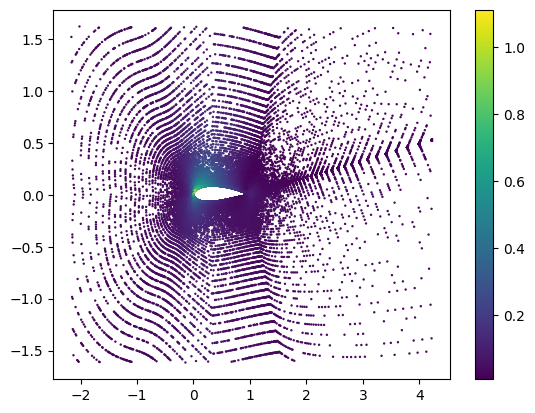

In [88]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_std[..., 2].cpu().detach(), s=0.5)
plt.colorbar()

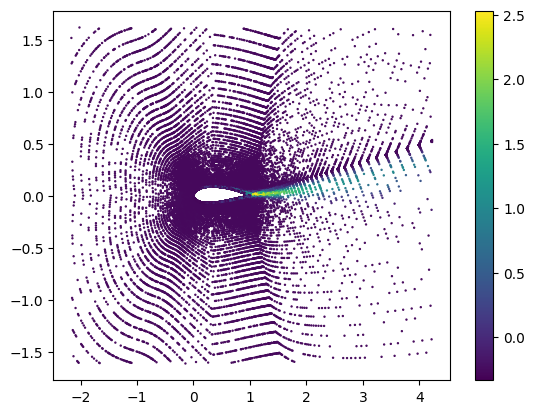

In [89]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_mean[..., 3].cpu().detach(), s=0.5)
plt.colorbar()

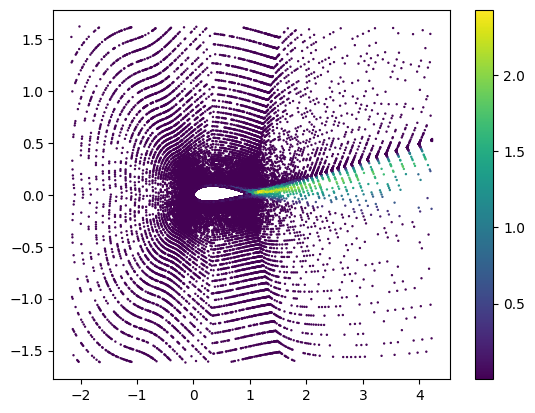

In [90]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_std[..., 3].cpu().detach(), s=0.5)
plt.colorbar()

In [46]:
# check if the model has the same loss

In [91]:
graph, idx = trainset.get(11)
graph = graph.cuda()

In [94]:
t = 500 - 1
timestamps = torch.linspace(0, 1, 500)

In [95]:
x = graph.z_fields
alpha_t = alpha_bar.cuda()[t]  # Calculate alpha based on t
#b = beta_t[t]   # Calculate beta based on t

# Generate noise samples
noise_ = torch.randn_like(x)

noise = noise_ * ((1 - alpha_t.unsqueeze(-1)) ** 0.5)  # Apply beta_t scaling

# Denoising diffusion
x_noisy =  (alpha_t.unsqueeze(-1) ** 0.5) * x + noise

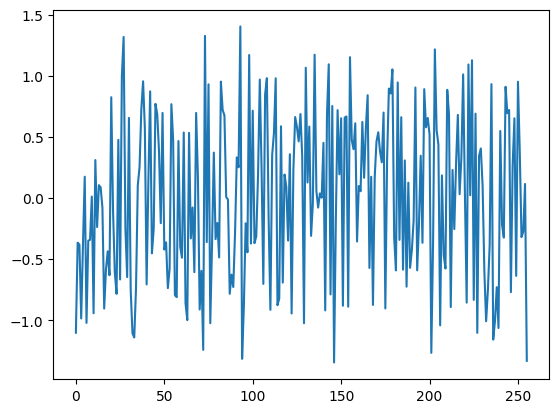

In [96]:
plt.plot(x.cpu().squeeze())

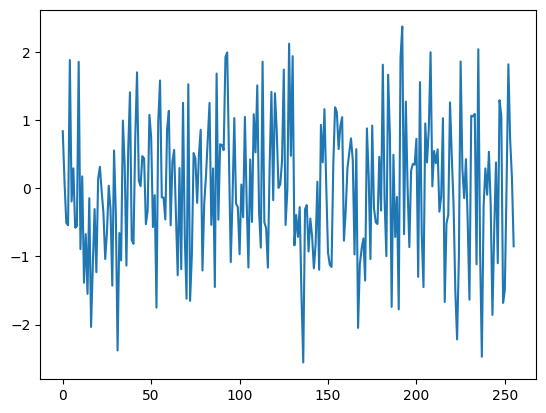

In [98]:
plt.plot(x_noisy.cpu().squeeze())

In [99]:
x_out = model(x_noisy, timestamps[t].unsqueeze(0).cuda())
#loss = F.mse_loss(x_out, noise)

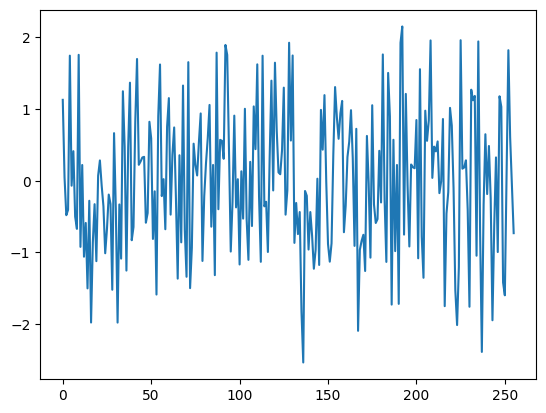

In [100]:
plt.plot(x_out.cpu().detach().squeeze())

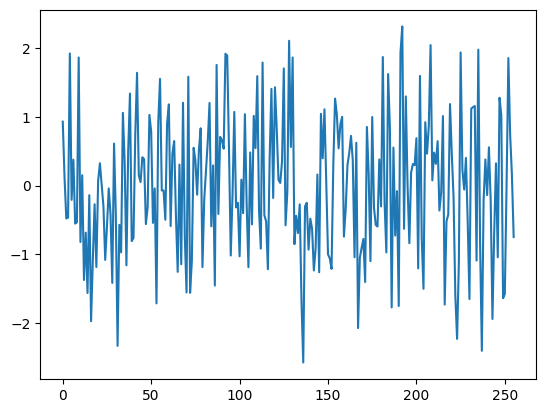

In [101]:
plt.plot(noise_.cpu().detach().squeeze())

In [102]:
((noise_ - x_out)**2).mean()

tensor(0.0157, device='cuda:0', grad_fn=<MeanBackward0>)

# generate from the noisy latent 

In [119]:
z = x_noisy
total_steps = 500
steps = 500

timestamps = torch.linspace(0, 1, total_steps).cuda()

for t in range(steps-1, 0, -1):

    time = timestamps[t].unsqueeze(0)

    if t > 1:
        eps = torch.randn(1).cuda()
    else:
        eps = 0

    z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*model(z, time)) + beta[t]*eps

    # because of the mistake


    #z = (alpha[t])**(-0.5)*(z - (1-alpha[t])/(1-alpha_bar[t])*model(z, time) ) + beta[t]*eps

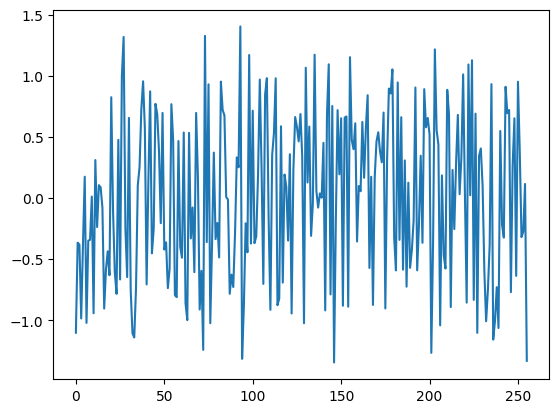

In [120]:
plt.plot(x.cpu().detach().squeeze())

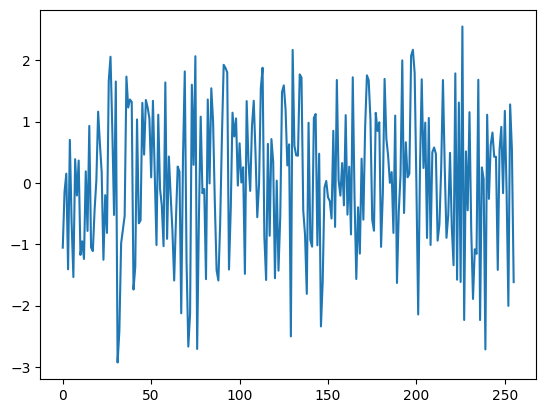

In [122]:
plt.plot(z.cpu().detach().squeeze())

In [123]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z * sigma_fields + mu_fields
    )
    pred.cpu().detach()

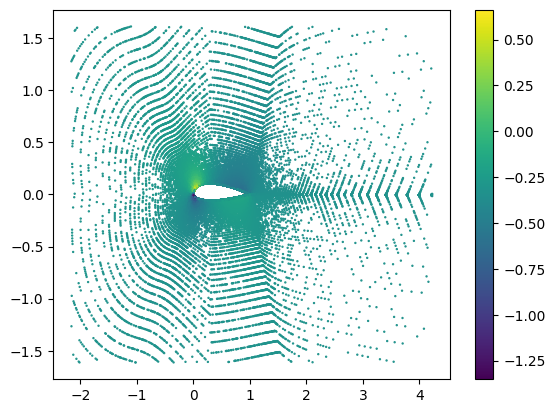

In [124]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vy.cpu().detach(), s=0.5)
plt.colorbar()

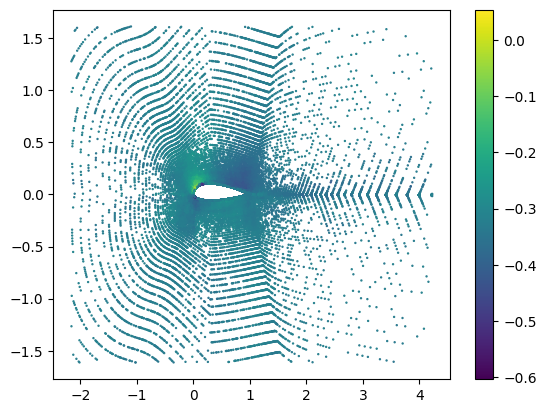

In [125]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 1].cpu().detach(), s=0.5)
plt.colorbar()

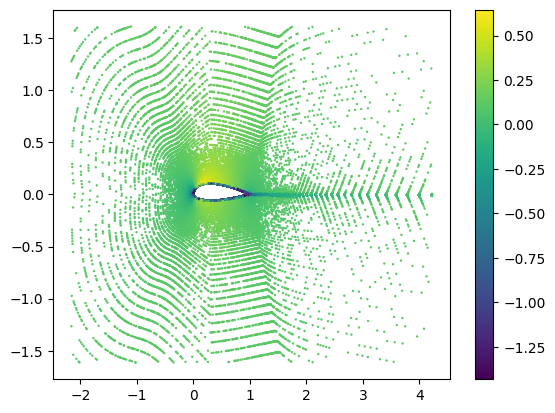

In [127]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)
plt.colorbar()

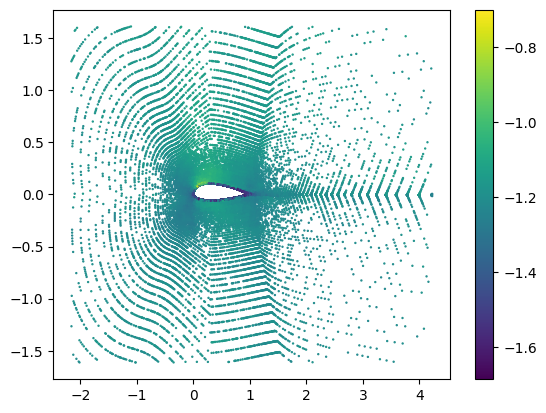

In [126]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 0].cpu().detach(), s=0.5)
plt.colorbar()

# II. Classifier guidance 

In [250]:
alpha = torch.Tensor(alpha)
beta = torch.Tensor(beta)
alpha_bar = torch.Tensor(alpha_bar)

In [251]:
reg = ResNet(
    input_dim=latent_dim,
    hidden_dim=width,
    output_dim=latent_dim + 2,
    depth=depth,
    dropout=0.,
    activation=activation,
).cuda()

In [252]:
run_name_regressor = "misunderstood-hill-1176" #"dutiful-wildflower-1154" #"lunar-pyramid-1156" #"dutiful-wildflower-1154"#"trim-bird-1152"# #"worldly-dawn-1150" #"comfy-frog-1148" #"resilient-vortex-1143"
path = f"/data/serrano/functa2functa/airfrans/{task}/model/{run_name_regressor}.pt"
ddpm_input = torch.load(path)
reg.load_state_dict(ddpm_input['model'])
reg.eval()

ResNet(
  (net): Sequential(
    (0): ResBlock(
      (linear1): Linear(in_features=256, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=256, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (1): ResBlock(
      (linear1): Linear(in_features=256, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=256, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (2): ResBlock(
      (linear1): Linear(in_features=256, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=256, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (3): ResBlock(
      (linear1): Linear(in_features=256, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=256, bias=True)
  

In [253]:
def guided_score(ddpm, regressor, x, y, time, alpha_bar_t, weight=1):
    x = x.requires_grad_(True)
    base_score = ddpm(x, time)
    loss = ((regressor(x).squeeze() - y.squeeze()) ** 2).mean()
    grad = torch.autograd.grad(loss, x)[0]
    
    score = base_score - weight * torch.sqrt(1 - alpha_bar_t) * grad
    
    return score

In [373]:
def guided_sample_ddpm(ddpm, regressor, y, alpha, beta, alpha_bar, z_dim=256, steps=500, total_steps=500, weight=0.01):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.linspace(0, 1, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(1).cuda()
        else:
            eps = 0
            
        score = guided_score(ddpm, regressor, z, y, time, alpha_bar[t], weight)
            
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*score) + torch.sqrt(beta[t])*eps
        
    return z

In [408]:
graph, idx = trainset.get(51)
graph = graph.cuda()

In [409]:
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

In [435]:
z_sample = guided_sample_ddpm(ddpm, reg, y, alpha, beta, alpha_bar, z_dim=256, steps=500, total_steps=500, weight=1)

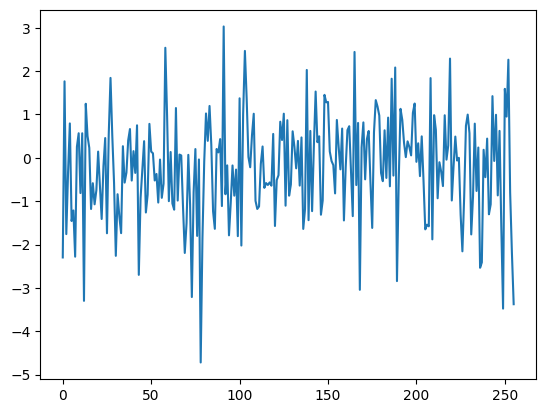

In [436]:
plt.plot(z_sample.cpu().detach().squeeze())

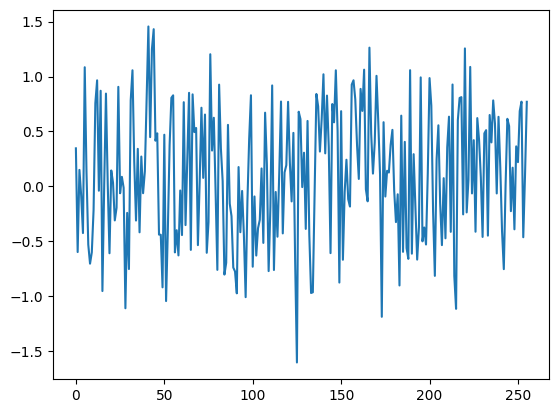

In [411]:
plt.plot(z_sample.cpu().detach().squeeze())

In [440]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )

In [423]:
pred

tensor([[-1.0344, -0.2641,  0.0169, -0.2613],
        [ 0.5931, -0.1112,  0.1104, -0.2686],
        [ 0.3710,  0.0562,  0.2373, -0.2643],
        ...,
        [ 0.5102,  0.1706,  0.1304, -0.2701],
        [-1.1580, -0.2570, -0.8071, -0.2642],
        [ 0.1689,  0.8921,  0.1289, -0.2644]], device='cuda:0')

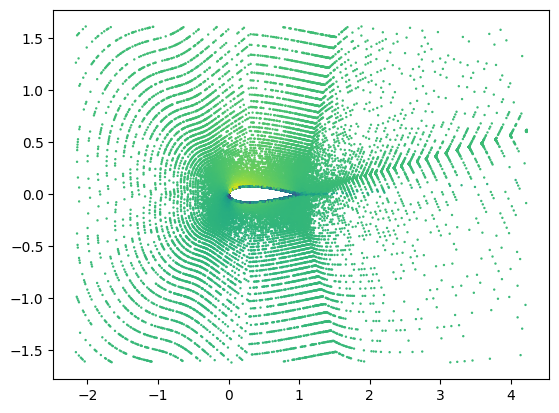

In [424]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 0].cpu().detach(), s=0.5)

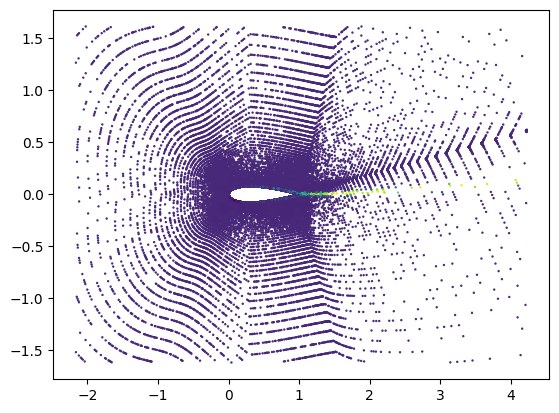

In [425]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 3].cpu().detach(), s=0.5)

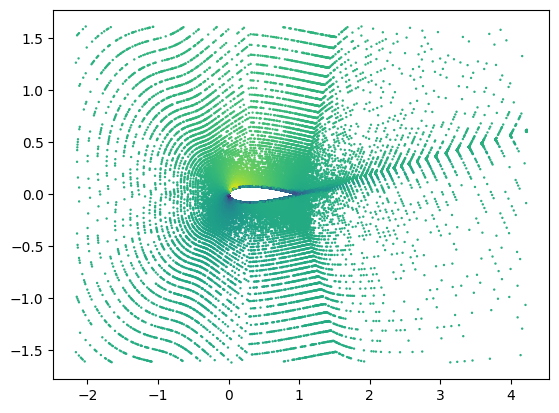

In [416]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)

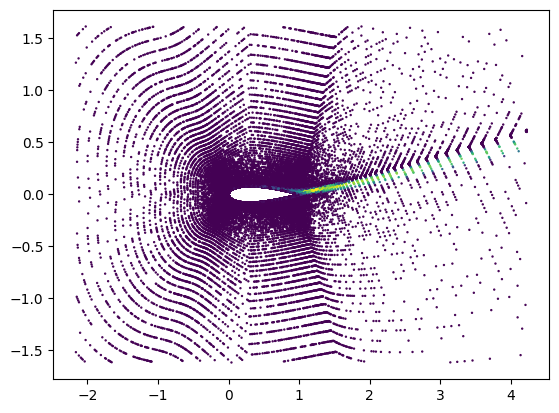

In [417]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.nu.cpu().detach(), s=0.5)

In [438]:
images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

In [441]:
((pred - images)**2).mean()

tensor(2.0627, device='cuda:0')

In [428]:
pred.shape

torch.Size([64000, 4])

In [429]:
images.shape

torch.Size([64000, 4])

In [430]:
((pred - images)**2)[..., 0].mean()

tensor(0.4027, device='cuda:0')

In [391]:
toto = reg(z_sample.cuda()).squeeze()

In [392]:
toto[-2:]

tensor([0.7000, 0.1702], device='cuda:0', grad_fn=<SliceBackward0>)

In [444]:
y.squeeze()[-2:]

tensor([1.0043, 1.6672], device='cuda:0')

In [442]:
toto = reg(graph.z_fields.cuda()).squeeze()

In [443]:
toto[-2:]

tensor([1.2093, 1.8057], device='cuda:0', grad_fn=<SliceBackward0>)

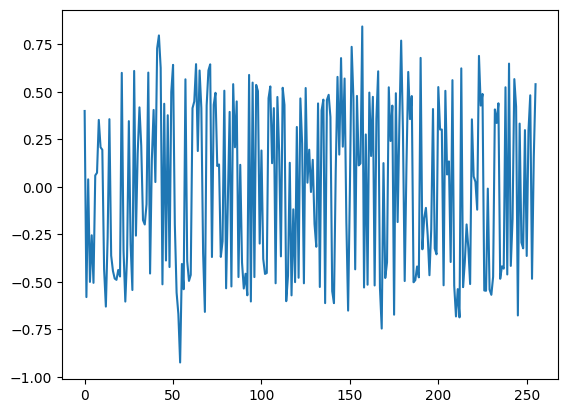

In [398]:
plt.plot(toto[:-2].cpu().detach())

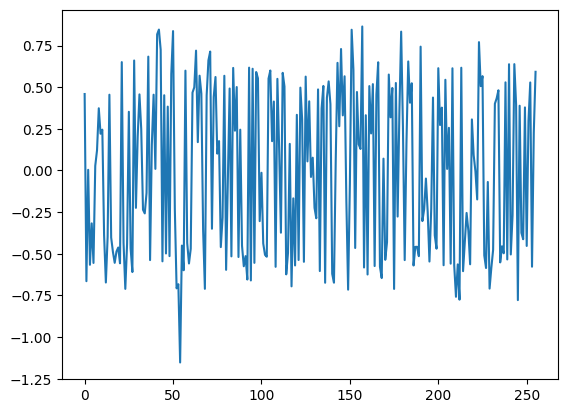

In [405]:
plt.plot(y.squeeze()[:-2].cpu().detach())

In [445]:
((toto - y)**2).mean()

tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)

In [446]:
# better link with the inlet velocities

In [529]:
graph, idx = trainset.get(1)
graph = graph.cuda()

In [530]:
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

In [531]:
#  
d = 5
inlet_pos = torch.Tensor([0, -d])
inlet_sdf = (torch.Tensor([d]) - mean_sdf) / std_sdf
p_inlet = torch.cat([inlet_pos, inlet_sdf], axis=-1).cuda()

In [532]:
p_inlet.shape

torch.Size([3])

In [533]:
pred = inr_fields.modulated_forward(
        p_inlet.unsqueeze(0), graph.z_fields * sigma_fields + mu_fields)

In [534]:
pred

tensor([[ 0.4203, -0.4115,  0.2349, -0.2684]], device='cuda:0',
       grad_fn=<AddmmBackward0>)

In [535]:
graph.inlet_x

tensor([-0.1627], device='cuda:0')

In [536]:
graph.inlet_y

tensor([-1.3594], device='cuda:0')

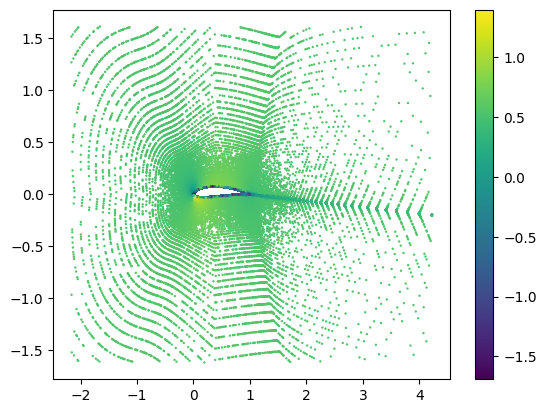

In [537]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)
plt.colorbar()

In [674]:
mu_x = trainset.coef_norm[0]
std_x = trainset.coef_norm[1]

In [675]:
inlet_x = graph.inlet_x  * std_x[2] + mu_x[2]
inlet_y = graph.inlet_y  * std_x[3] + mu_x[3]

In [676]:
inlet_x

tensor([42.8048], device='cuda:0')

In [677]:
inlet_y

tensor([6.7069], device='cuda:0')

In [678]:
mu_y = trainset.coef_norm[2]
std_y = trainset.coef_norm[3]

In [679]:
vx = graph.vx * std_y[0] + mu_y[0]
vy = graph.vy * std_y[1] + mu_y[1]

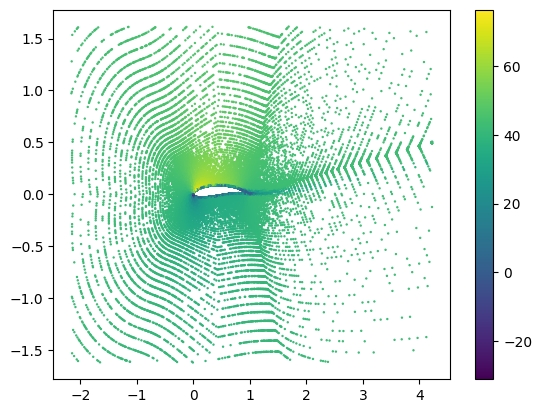

In [680]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=vx.cpu().detach(), s=0.5)
plt.colorbar()

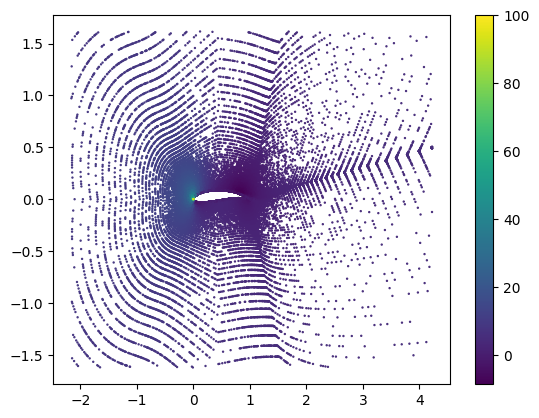

In [681]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=vy.cpu().detach(), s=0.5)
plt.colorbar()

In [753]:
graph, idx = trainset.get(100)
graph = graph.cuda()

In [754]:
#  
d = 10
inlet_pos = torch.Tensor([-d, 0])
inlet_sdf = (torch.Tensor([d]) - mean_sdf) / std_sdf
p_inlet = torch.cat([inlet_pos, inlet_sdf], axis=-1).cuda()

p_inlet.shape

torch.Size([3])

In [755]:
pred = inr_fields.modulated_forward(
        p_inlet.unsqueeze(0), graph.z_fields * sigma_fields + mu_fields).squeeze()

In [756]:
inlet_x_hat = pred[0] * std_y[0] + mu_y[0]

In [757]:
inlet_y_hat = pred[1] * std_y[1] + mu_y[1]

In [758]:
inlet_x_hat

tensor(76.3993, device='cuda:0', grad_fn=<AddBackward0>)

In [759]:
inlet_y_hat

tensor(24.4606, device='cuda:0', grad_fn=<AddBackward0>)

In [760]:
inlet_x = graph.inlet_x  * std_x[2] + mu_x[2]
inlet_y = graph.inlet_y  * std_x[3] + mu_x[3]

In [761]:
inlet_x

tensor([81.5541], device='cuda:0')

In [762]:
inlet_y

tensor([21.6039], device='cuda:0')

In [740]:
vx = graph.vx * std_y[0] + mu_y[0]
vy = graph.vy * std_y[1] + mu_y[1]

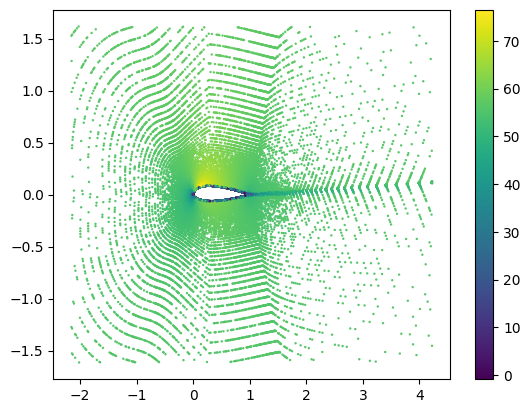

In [741]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=vx.cpu().detach(), s=0.5)
plt.colorbar()

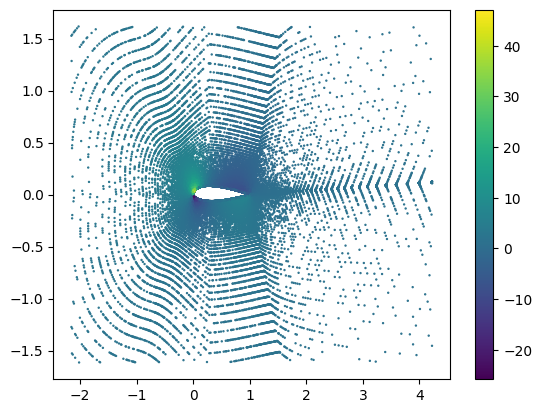

In [742]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=vy.cpu().detach(), s=0.5)
plt.colorbar()

# III. With the prob constraint

In [1031]:
alpha = torch.Tensor(alpha)
beta = torch.Tensor(beta)
alpha_bar = torch.Tensor(alpha_bar)

In [764]:
# try guiding the generation with the prob constraint
# no sdf for now

In [1528]:
def guided_score_obs(ddpm, regressor, x, y, time, alpha_bar_t, coef_norm, weight=1):
    
    mu_x = coef_norm[0]
    std_x = coef_norm[1]
    
    mu_y = coef_norm[2]
    std_y = coef_norm[3]
    
    x = x.requires_grad_(True)
    base_score = ddpm(x, time)
    
    d = 10 + np.random.randn() * 0.1
    inlet_pos = torch.Tensor([-d, np.random.randn()* 0.1])
    inlet_sdf = (torch.Tensor([d]) - mean_sdf) / std_sdf
    p_inlet = torch.cat([inlet_pos, inlet_sdf], axis=-1).cuda()
    
    pred = inr_fields.modulated_forward(
        p_inlet.unsqueeze(0), x.unsqueeze(0) * sigma_fields + mu_fields).squeeze()
    
    inlet_x_hat = pred[0] * std_y[0] + mu_y[0]
    inlet_y_hat = pred[1] * std_y[1] + mu_y[1]
    
    inlet_x = y.squeeze()[-2] * std_y[0] + mu_y[0]
    inlet_y = y.squeeze()[-1] * std_y[1] + mu_y[1]
    
    loss1 = -1/2*((inlet_x_hat/100 - inlet_x/100)**2 + (inlet_y_hat/100 - inlet_y/100)**2)
    loss2 = -10/2*((regressor(x).squeeze()[:-2] - y.squeeze()[:-2])**2).mean()
    
    print('loss1', loss1.item())
    print('loss2', loss2.item())
    
    grad = torch.autograd.grad(loss1 + loss2, x)[0]
    score = base_score - weight * torch.sqrt(1 - alpha_bar_t) * grad
    
    return score

def guided_sample_ddpm_obs(ddpm, regressor, y, alpha, beta, alpha_bar, coef_norm, z_dim=256, steps=500, total_steps=500, weight=1):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.linspace(0, 1, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(1).cuda()
        else:
            eps = 0
            
        score = guided_score_obs(ddpm, regressor, z, y, time, alpha_bar[t], coef_norm, weight)
            
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*score) + torch.sqrt(beta[t])*eps
        
    return z

In [1538]:
graph, idx = trainset.get(201)
graph = graph.cuda()

In [1539]:
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

In [1540]:
z_sample = guided_sample_ddpm_obs(ddpm, reg, y, alpha, beta, alpha_bar, trainset.coef_norm, z_dim=256, steps=500, total_steps=500, weight=1)

loss1 -0.068030446767807
loss2 -0.17991481721401215
loss1 -0.06341325491666794
loss2 -0.20128735899925232
loss1 -0.059891022741794586
loss2 -0.2497076690196991
loss1 -0.06513919681310654
loss2 -0.22966288030147552
loss1 -0.0630272850394249
loss2 -0.27624592185020447
loss1 -0.05851846933364868
loss2 -0.24848587810993195
loss1 -0.0608212873339653
loss2 -0.3739127516746521
loss1 -0.06542755663394928
loss2 -0.2673290967941284
loss1 -0.0634564757347107
loss2 -0.19421625137329102
loss1 -0.06829167902469635
loss2 -0.20886452496051788
loss1 -0.061226002871990204
loss2 -0.18447476625442505
loss1 -0.058983299881219864
loss2 -0.18440158665180206
loss1 -0.061105646193027496
loss2 -0.18987014889717102
loss1 -0.06700547784566879
loss2 -0.2663153111934662
loss1 -0.05694190412759781
loss2 -0.29036009311676025
loss1 -0.06067904084920883
loss2 -0.36405667662620544
loss1 -0.06322363018989563
loss2 -0.38315731287002563
loss1 -0.059460848569869995
loss2 -0.3537169098854065
loss1 -0.05930350720882416
loss2 

loss1 -0.0722755566239357
loss2 -0.45080727338790894
loss1 -0.06834621727466583
loss2 -0.5291577577590942
loss1 -0.07512170076370239
loss2 -0.48874467611312866
loss1 -0.0787508636713028
loss2 -0.4959383010864258
loss1 -0.07392483949661255
loss2 -0.4952200651168823
loss1 -0.07642492651939392
loss2 -0.5669742226600647
loss1 -0.06888054311275482
loss2 -0.5874520540237427
loss1 -0.07482431828975677
loss2 -0.737697958946228
loss1 -0.07777990400791168
loss2 -0.6114540100097656
loss1 -0.07712849974632263
loss2 -0.6710043549537659
loss1 -0.07446214556694031
loss2 -0.7882142066955566
loss1 -0.07921507954597473
loss2 -0.8092918395996094
loss1 -0.08021216094493866
loss2 -0.9981575608253479
loss1 -0.07721184939146042
loss2 -1.3320153951644897
loss1 -0.07503366470336914
loss2 -1.405996322631836
loss1 -0.08109663426876068
loss2 -1.385629415512085
loss1 -0.07749473303556442
loss2 -1.2055118083953857
loss1 -0.08080655336380005
loss2 -1.2881982326507568
loss1 -0.07787753641605377
loss2 -1.2007436752319

loss1 -0.08868430554866791
loss2 -0.4179879426956177
loss1 -0.08725854754447937
loss2 -0.3751278519630432
loss1 -0.0909542515873909
loss2 -0.3472435176372528
loss1 -0.09440845251083374
loss2 -0.3339541256427765
loss1 -0.09253699332475662
loss2 -0.34000903367996216
loss1 -0.09081847965717316
loss2 -0.29342806339263916
loss1 -0.1024685949087143
loss2 -0.3220582604408264
loss1 -0.08927850425243378
loss2 -0.3240714967250824
loss1 -0.08941063284873962
loss2 -0.32434654235839844
loss1 -0.09145522117614746
loss2 -0.3320840299129486
loss1 -0.09188628941774368
loss2 -0.3276485204696655
loss1 -0.08819902688264847
loss2 -0.298998087644577
loss1 -0.09203458577394485
loss2 -0.3086087703704834
loss1 -0.09644109010696411
loss2 -0.28475964069366455
loss1 -0.10015318542718887
loss2 -0.2734967768192291
loss1 -0.09763732552528381
loss2 -0.2669268548488617
loss1 -0.0964844673871994
loss2 -0.27639615535736084
loss1 -0.09255680441856384
loss2 -0.2840348184108734
loss1 -0.09079919010400772
loss2 -0.269104033

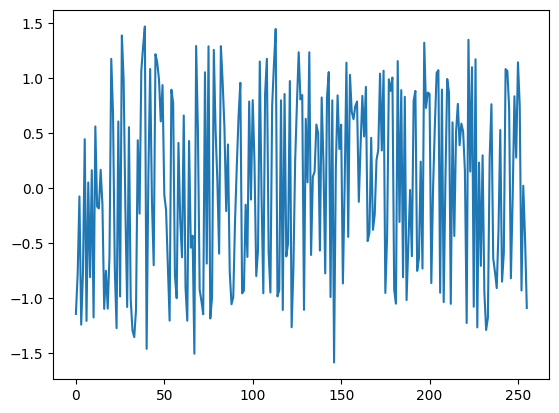

In [1541]:
plt.plot(z_sample.cpu().detach().squeeze())

In [1542]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )

In [1543]:
images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

In [1544]:
((pred - images)**2).mean()

tensor(0.3760, device='cuda:0')

In [1545]:
((pred[0] - images[0])**2).mean()

tensor(0.7412, device='cuda:0')

In [1546]:
((pred[1] - images[1])**2).mean()

tensor(0.1475, device='cuda:0')

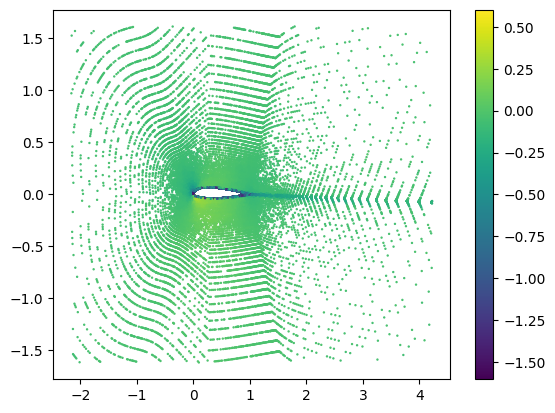

In [1547]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 0].cpu().detach(), s=0.5)
plt.colorbar()

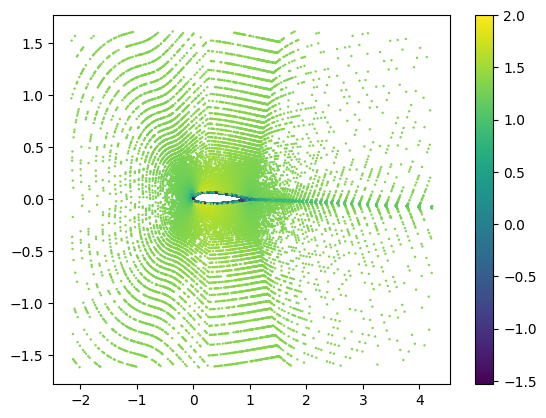

In [1548]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)
plt.colorbar()

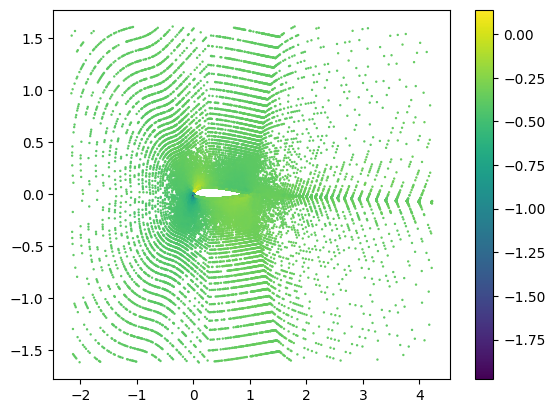

In [1549]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 1].cpu().detach(), s=0.5)
plt.colorbar()

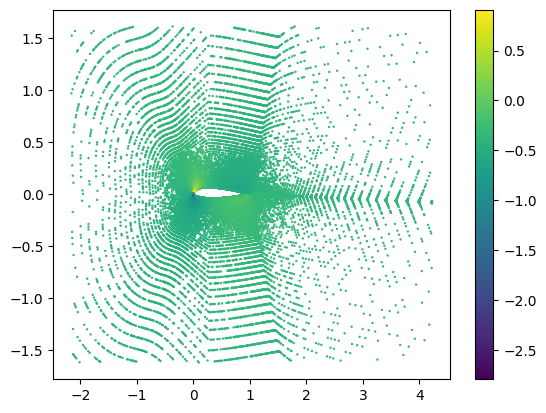

In [1550]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vy.cpu().detach(), s=0.5)
plt.colorbar()

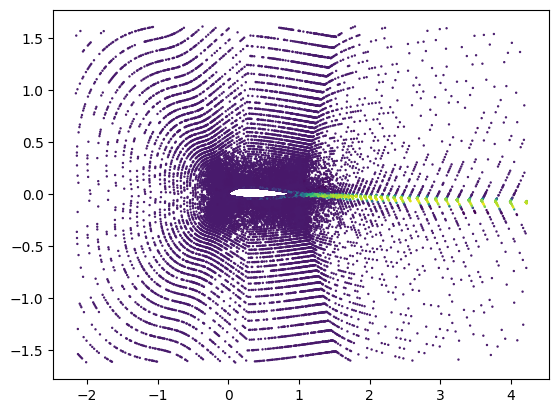

In [1551]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 3].cpu().detach(), s=0.5)

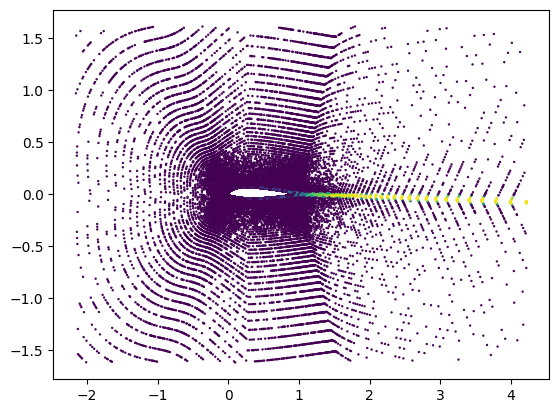

In [1552]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.nu.cpu().detach(), s=0.5)

In [1311]:
images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

In [1312]:
((pred - images)**2).mean()

tensor(1.5719, device='cuda:0')

In [1284]:
((pred[0] - images[0])**2).mean()

tensor(0.4331, device='cuda:0')

In [1285]:
((pred[1] - images[1])**2).mean()

tensor(0.5480, device='cuda:0')

# III. Conditional DDPM

In [401]:
import math
def betas_for_alpha_bar(num_diffusion_timesteps, alpha_bar, max_beta=0.999):
    """
    Create a beta schedule that discretizes the given alpha_t_bar function,
    which defines the cumulative product of (1-beta) over time from t = [0,1].

    :param num_diffusion_timesteps: the number of betas to produce.
    :param alpha_bar: a lambda that takes an argument t from 0 to 1 and
                      produces the cumulative product of (1-beta) up to that
                      part of the diffusion process.
    :param max_beta: the maximum beta to use; use values lower than 1 to
                     prevent singularities.
    """
    betas = []
    for i in range(num_diffusion_timesteps):
        t1 = i / num_diffusion_timesteps
        t2 = (i + 1) / num_diffusion_timesteps
        betas.append(min(1 - alpha_bar(t2) / alpha_bar(t1), max_beta))
    return np.array(betas)

In [402]:
from infinity.ddpm import ConditionalDDPM

In [403]:
ddpm_steps=1000 
T = ddpm_steps
#beta = np.linspace(1e-4, 0.02, T)
#alpha = 1 - beta
#alpha_bar = torch.Tensor(np.cumprod(alpha))

beta = betas_for_alpha_bar(
            ddpm_steps,
            lambda t: math.cos((t + 0.008) / 1.008 * math.pi / 2) ** 2,
        )
alpha = 1 - beta
alpha_bar = torch.Tensor(np.cumprod(alpha))

alpha = torch.Tensor(alpha)
alpha_bar = torch.Tensor(alpha_bar)
beta = torch.Tensor(beta)

timestamps = torch.linspace(0, 1, T).cuda()

ddpm = ConditionalDDPM(in_channels=latent_dim,
             y_channels=256+2,
             embed_channels=512,
             hidden_channels=512,
             out_channels=latent_dim,
             depth=3,
             droprate=0.3).cuda()

In [404]:
run_name_ddpm = "bright-wave-1225" #"dutiful-wildflower-1154" #"lunar-pyramid-1156" #"dutiful-wildflower-1154"#"trim-bird-1152"# #"worldly-dawn-1150" #"comfy-frog-1148" #"resilient-vortex-1143"
path = f"/data/serrano/functa2functa/airfrans/{task}/model/{run_name_ddpm}.pt"
ddpm_input = torch.load(path)
ddpm.load_state_dict(ddpm_input['model'])
ddpm.eval()

ConditionalDDPM(
  (embedding): SinusoidalPosEmb()
  (lift): Linear(in_features=256, out_features=512, bias=True)
  (project): Linear0(
    (linear): Linear(in_features=770, out_features=256, bias=True)
  )
  (activation): SiLU()
  (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (residual_blocks): ModuleList(
    (0-2): 3 x ConditionalResMLPBlock(
      (linear1): Linear(in_features=512, out_features=512, bias=True)
      (linear2): Linear(in_features=258, out_features=512, bias=True)
      (linear3): Linear(in_features=512, out_features=512, bias=True)
      (linear0): Linear0(
        (linear): Linear(in_features=512, out_features=512, bias=True)
      )
      (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (layer_norm2): LayerNorm((258,), eps=1e-05, elementwise_affine=True)
      (layer_norm3): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.3, inplace=False)
      (activation): SiLU()
    )
  )
)

In [405]:
alpha = torch.Tensor(alpha)
alpha_bar = torch.Tensor(alpha_bar)
beta = torch.Tensor(beta)

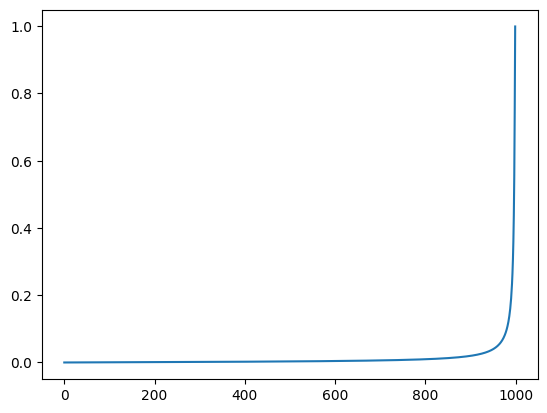

In [406]:
plt.plot(beta)

In [407]:
def sample_conditional_ddpm(model, y, alpha, beta, alpha_bar, z_dim=256, steps=1000, total_steps=1000):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.linspace(0, 1, total_steps).cuda()
    #timestamps = torch.arange(0, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(z_dim).cuda()
        else:
            eps = 0
            
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*model(z, y, time)) + torch.sqrt(beta[t])*eps

        
    return z

In [408]:
mean_sdf = trainset.coef_norm[0][4]
std_sdf = trainset.coef_norm[1][4]

In [409]:
sigma_fields = sigma_fields.cuda()
mu_fields = mu_fields.cuda()

In [452]:
graph, idx = testset.get(93)

In [453]:
graph = graph.cuda()
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

In [454]:
z_sample = sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000)

In [455]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )
    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

print(((pred - images)**2).mean(0))

tensor([0.0022, 0.0053, 0.0016, 0.0103], device='cuda:0')


In [441]:
z_sample.std()

tensor(0.2888, device='cuda:0', grad_fn=<StdBackward0>)

In [442]:
z_plot = z_sample.cpu().detach().squeeze()

In [245]:
plt.plot(z_plot, label='pred')
plt.plot(graph.z_fields.cpu().detach().squeeze(), label="gt")
plt.legend()

In [186]:
eps = torch.randn_like(graph.z_fields)
x_noisy = (alpha_bar[-1].cuda().unsqueeze(-1) ** 0.5) * graph.z_fields + eps * ((1 - alpha_bar[-1].cuda().unsqueeze(-1)) ** 0.5) 

In [174]:
z = x_noisy
timestamps = torch.arange(0, ddpm_steps).cuda()

for t in range(ddpm_steps-1, 0, -1):

    time = timestamps[t].unsqueeze(0)

    if t > 1:
        eps = torch.randn_like(z).cuda()
    else:
        eps = 0

    z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*ddpm(z, y, time)) + beta[t]*eps

    # because of the mistake


    #z = (alpha[t])**(-0.5)*(z - (1-alpha[t])/(1-alpha_bar[t])*model(z, time) ) + beta[t]*eps


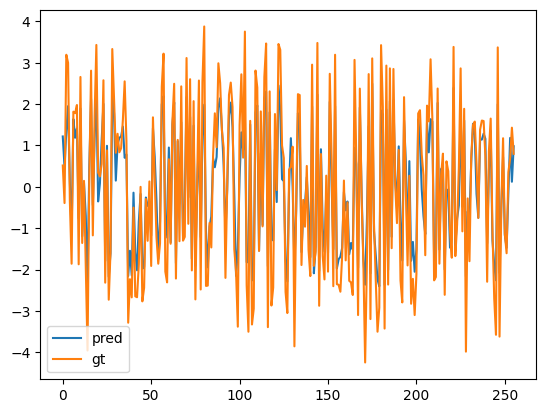

In [443]:
plt.plot(5*z_sample.cpu().detach().squeeze(), label='pred')
plt.plot(5*graph.z_fields.cpu().detach().squeeze(), label="gt")
plt.legend()
plt.show()

In [176]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )
    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

In [177]:
((pred - images)**2).mean(0)

tensor([0.8507, 1.5033, 3.0316, 2.5227], device='cuda:0')

In [150]:
pred.mean(0)

tensor([ 0.3149,  0.4824, -0.3099, -0.0149], device='cuda:0')

In [151]:
images.mean(0)

tensor([-0.1362,  0.6044, -0.5178,  0.2187], device='cuda:0')

In [152]:
pred.std(0)

tensor([1.1410, 1.3776, 1.1659, 0.8138], device='cuda:0')

In [153]:
images.std(0)

tensor([1.1306, 1.5429, 1.5200, 1.6392], device='cuda:0')

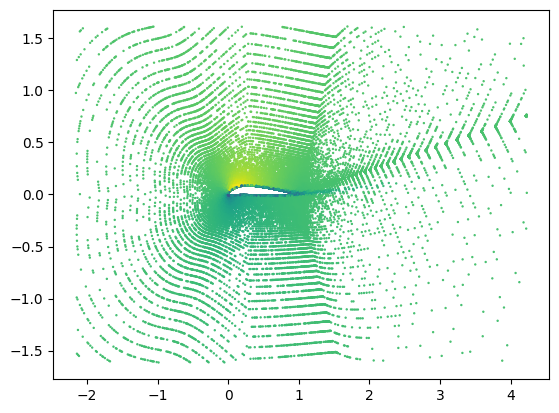

In [144]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 0].cpu().detach(), s=0.5)

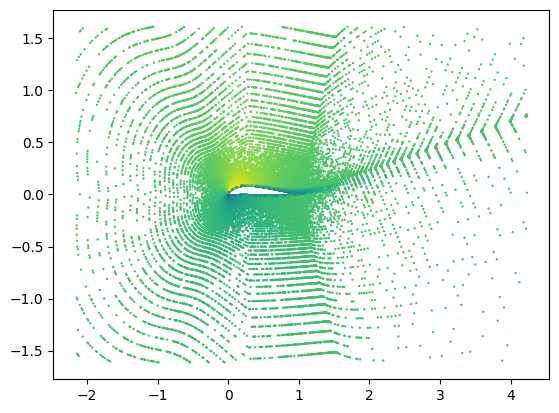

In [145]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vx.cpu().detach(), s=0.5)

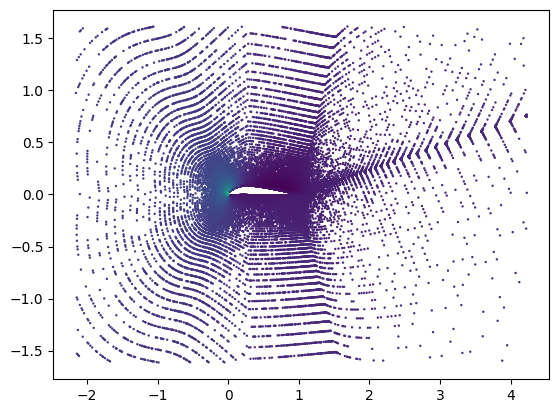

In [146]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 1].cpu().detach(), s=0.5)

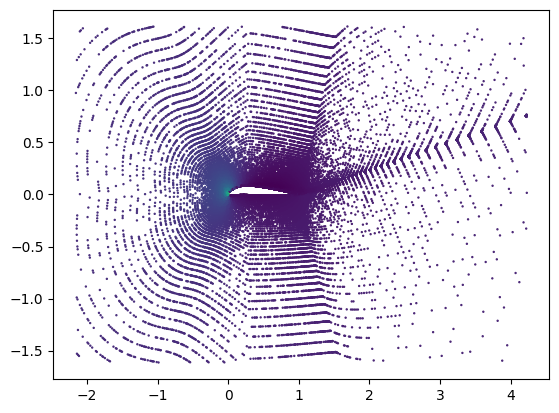

In [147]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.vy.cpu().detach(), s=0.5)

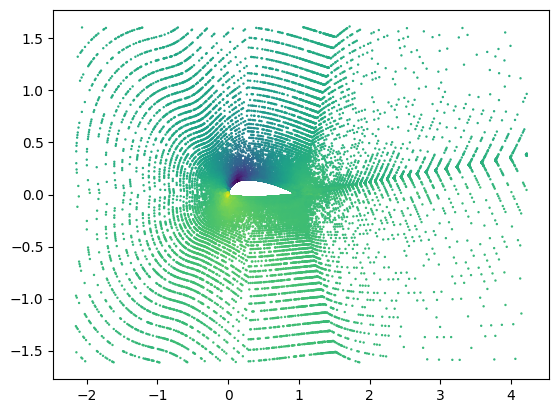

In [183]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 2].cpu().detach(), s=0.5)

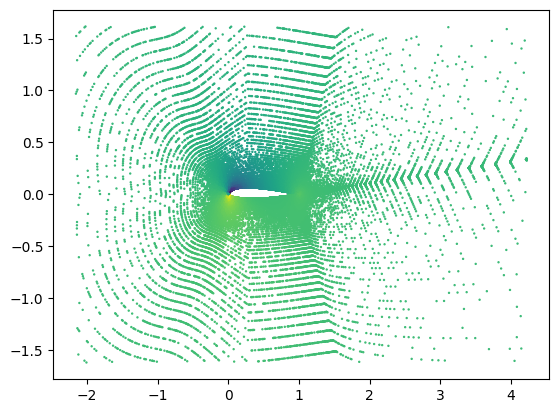

In [163]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.p.cpu().detach(), s=0.5)

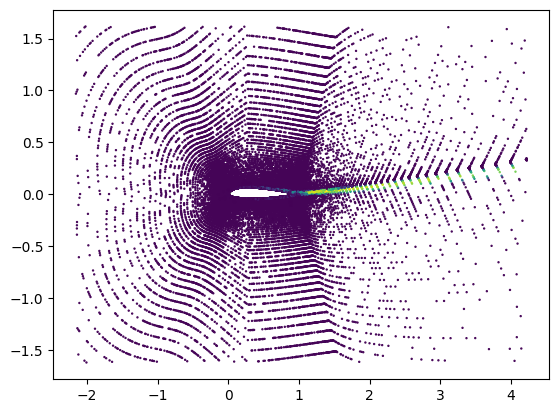

In [164]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred[..., 3].cpu().detach(), s=0.5)

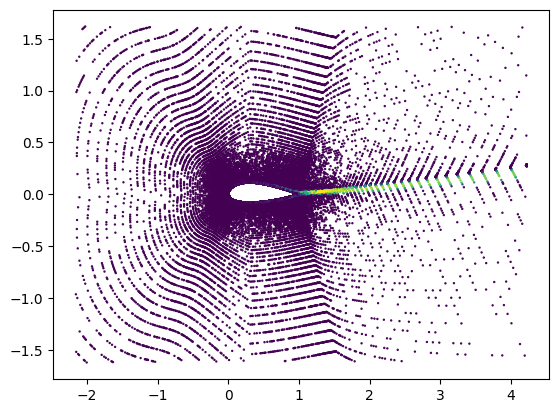

In [135]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.nu.cpu().detach(), s=0.5)

In [49]:
num_samples = 5
z_dist = torch.zeros(num_samples, 256)
pred_dist = torch.zeros(num_samples, 64000, 4)

graph, idx = testset.get(102)
graph = graph.cuda()
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

for i in range(num_samples):
    z_sample = sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000)
    z_dist[i] = z_sample.cpu().detach()
    with torch.no_grad():
        graph = graph.cuda()
        pos = torch.cat([graph.pos, graph.sdf], axis=-1)
        pred = inr_fields.modulated_forward(
            pos, z_sample * sigma_fields + mu_fields
        )
        pred_dist[i] = pred.cpu().detach()
    

In [148]:
mse_test_loss = torch.zeros(4)
for i in range(len(testset)):
    num_samples = 5
    z_dist = torch.zeros(num_samples, 256)
    pred_dist = torch.zeros(num_samples, 64000, 4)

    graph, idx = testset.get(i)
    graph = graph.cuda()
    y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

    for j in range(num_samples):
        z_sample = sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000)
        z_dist[j] = z_sample.cpu().detach()
        with torch.no_grad():
            graph = graph.cuda()
            pos = torch.cat([graph.pos, graph.sdf], axis=-1)
            pred = inr_fields.modulated_forward(
                pos, z_sample * sigma_fields + mu_fields
            )
            pred_dist[j] = pred.cpu().detach()
    mse_test_loss += ((pred_dist.mean(0) - images.cpu())**2).mean(0)
    print(i, ((pred_dist.mean(0) - images.cpu())**2).mean(0))
    

0 tensor([0.0079, 0.0071, 0.0022, 0.0406])
1 tensor([0.0131, 0.0023, 0.0029, 0.2573])
2 tensor([0.0173, 0.0239, 0.1415, 0.0015])
3 tensor([0.0198, 0.0418, 0.0219, 0.0146])
4 tensor([0.0321, 0.0305, 0.1949, 0.3286])
5 tensor([0.0416, 0.1804, 0.0491, 0.1968])
6 tensor([0.0385, 0.1167, 0.0299, 0.2693])
7 tensor([0.0056, 0.0134, 0.0539, 0.0114])
8 tensor([0.0142, 0.0013, 0.0008, 0.0249])
9 tensor([0.0088, 0.0296, 0.0034, 0.0796])
10 tensor([0.0063, 0.0089, 0.0180, 0.0112])
11 tensor([0.0345, 0.0119, 0.0142, 0.1016])
12 tensor([0.0724, 0.0848, 0.0131, 0.3601])
13 tensor([0.0429, 0.1206, 0.0232, 0.1903])
14 tensor([0.0504, 0.1155, 0.0286, 0.0438])
15 tensor([0.0016, 0.0012, 0.0011, 0.0131])
16 tensor([0.0038, 0.0031, 0.0007, 0.0017])
17 tensor([0.0159, 0.0042, 0.0007, 0.0053])
18 tensor([0.0356, 0.0246, 0.2301, 0.3914])
19 tensor([0.0364, 0.0467, 0.1391, 0.0293])
20 tensor([0.0197, 0.0040, 0.0042, 0.0258])
21 tensor([0.0267, 0.0047, 0.0050, 0.2290])
22 tensor([0.0387, 0.0747, 0.0504, 0.1250]

185 tensor([0.0264, 0.1065, 0.0240, 0.2467])
186 tensor([0.0412, 0.1286, 0.1159, 0.1887])
187 tensor([0.0155, 0.0608, 0.0144, 0.0377])
188 tensor([0.0026, 0.0069, 0.0016, 0.0280])
189 tensor([0.0081, 0.0078, 0.0244, 0.0069])
190 tensor([0.0154, 0.0023, 0.0011, 0.0913])
191 tensor([0.0044, 0.0087, 0.0007, 0.0087])
192 tensor([0.0545, 0.0682, 0.0278, 0.0182])
193 tensor([0.0009, 0.0004, 0.0007, 0.0035])
194 tensor([0.0478, 0.0104, 0.0935, 0.2691])
195 tensor([0.0016, 0.0029, 0.0009, 0.0015])
196 tensor([0.0149, 0.0042, 0.0039, 0.1352])
197 tensor([0.0382, 0.0914, 0.2788, 0.1045])
198 tensor([0.0212, 0.0396, 0.2713, 0.0438])
199 tensor([0.0126, 0.0577, 0.0129, 0.0679])


In [463]:
ntest = len(testset)

In [150]:
print(mse_test_loss / ntest)

tensor([0.0221, 0.0334, 0.0471, 0.1333])


In [70]:
print(mse_test_loss / ntest)

tensor([0.0403, 0.0196, 0.0863, 0.2241])


In [464]:
print(mse_test_loss / ntest)

NameError: name 'mse_test_loss' is not defined

In [456]:
graph, idx = testset.get(19)
graph = graph.cuda()

In [457]:
num_samples = 10
z_dist = torch.zeros(num_samples, 256)
pred_dist = torch.zeros(num_samples, 64000, 4)

y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

ddpm.eval()

images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

for i in range(num_samples):
    z_sample = sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000)
    z_dist[i] = z_sample.cpu().detach()
    with torch.no_grad():
        graph = graph.cuda()
        pos = torch.cat([graph.pos, graph.sdf], axis=-1)
        pred = inr_fields.modulated_forward(
            pos, z_sample * sigma_fields + mu_fields
        )
        pred_dist[i] = pred.cpu().detach()
    

In [460]:
pred = inr_fields.modulated_forward(
        pos, torch.mean(z_dist, 0).unsqueeze(0).cuda() * sigma_fields + mu_fields
    )

In [461]:
((pred - images)**2).mean(0)

tensor([ 373.8419,  458.4280,   16.2961, 1986.2666], device='cuda:0',
       grad_fn=<MeanBackward1>)

In [462]:
((pred_dist - images.cpu())**2).mean(1)

tensor([[1.6944e-02, 2.3533e-02, 8.3045e-02, 7.9977e-03],
        [1.5004e+03, 3.5957e+01, 4.8574e+02, 3.7590e+03],
        [9.4819e+00, 3.8838e+00, 4.8235e+00, 8.1481e+00],
        [1.4609e+05, 5.8084e+04, 2.8784e+04, 1.8253e+04],
        [6.7148e-03, 1.0048e-02, 2.7895e-02, 5.5911e-03],
        [1.8539e+03, 1.4920e+02, 6.4829e+01, 1.8731e+01],
        [3.4855e-02, 9.9285e-02, 3.4370e-01, 9.8068e-01],
        [2.5452e+00, 3.8817e+00, 1.8496e+00, 3.0904e+01],
        [1.9284e-02, 3.8055e-02, 1.1787e-01, 1.6978e-01],
        [2.9235e-02, 1.2773e-02, 7.5671e-02, 1.4802e-01]])

In [153]:
print(((pred_dist.mean(0) - images.cpu())**2).mean(0))

tensor([0.0006, 0.0012, 0.0006, 0.0030])


In [154]:
print(((pred_dist.mean(0) - images.cpu())**2).std(0))

tensor([0.0012, 0.0026, 0.0012, 0.0282])


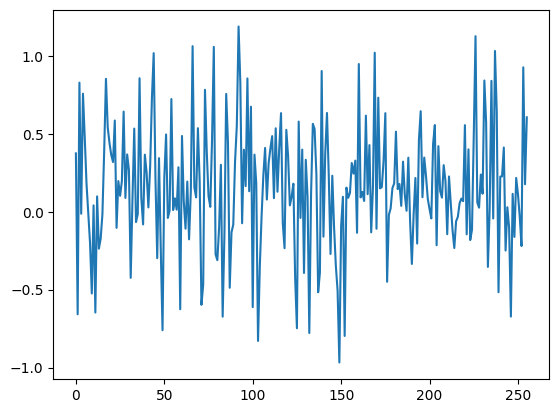

In [155]:
plt.plot(z_dist[0])

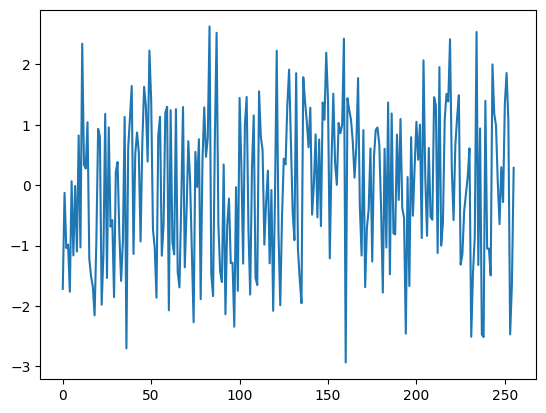

In [145]:
plt.plot(z_dist.mean(0))

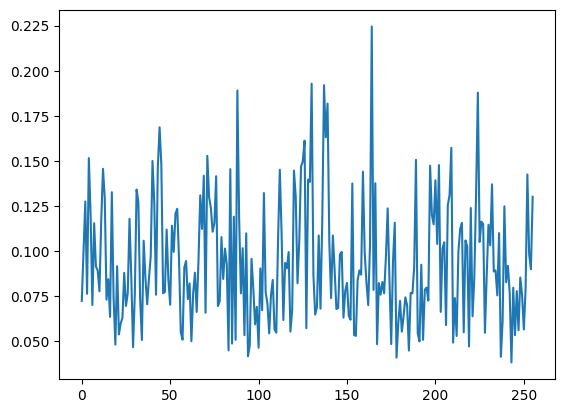

In [156]:
plt.plot(z_dist.std(0))

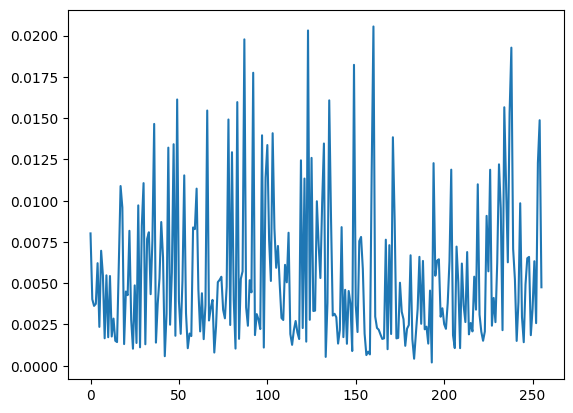

In [146]:
plt.plot(z_dist.std(0))

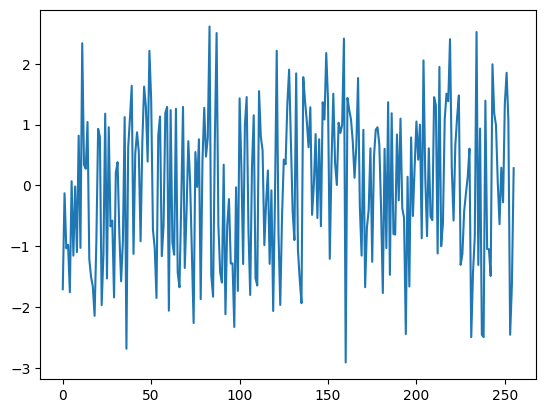

In [147]:
plt.plot(z_dist[9])

In [85]:
print(((pred_dist.mean(0) - images.cpu())**2).mean(0))

tensor([0.0169, 0.0018, 0.0015, 0.0291])


In [81]:
print(((pred_dist.mean(0) - images.cpu())**2).mean(0))

tensor([0.0177, 0.0142, 0.0181, 0.0084])


In [87]:
print(((pred_dist.mean(0) - images.cpu())**2).mean(0))

tensor([0.0255, 0.0154, 0.0165, 0.0228])


In [50]:
((pred_dist.mean(0) - images.cpu())**2).mean(0)

tensor([0.0060, 0.0019, 0.0021, 0.1938])

In [72]:
pred_z_bar = inr_fields.modulated_forward(
            pos, z_dist.mean(0).cuda().unsqueeze(0) * sigma_fields + mu_fields
        )

In [73]:
((pred_z_bar - images.cuda())**2).mean(0)

tensor([0.0031, 0.0018, 0.0006, 0.0841], device='cuda:0',
       grad_fn=<MeanBackward1>)

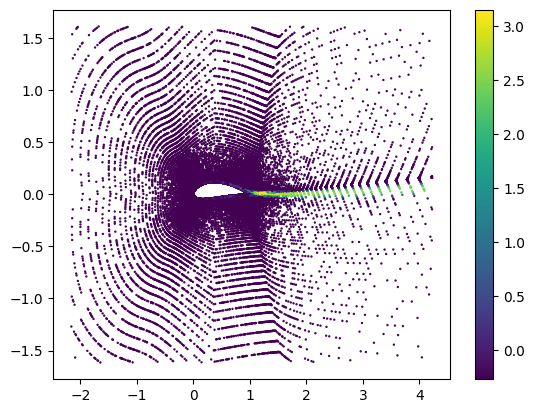

In [76]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=graph.nu.cpu().detach(), s=0.5)
plt.colorbar()

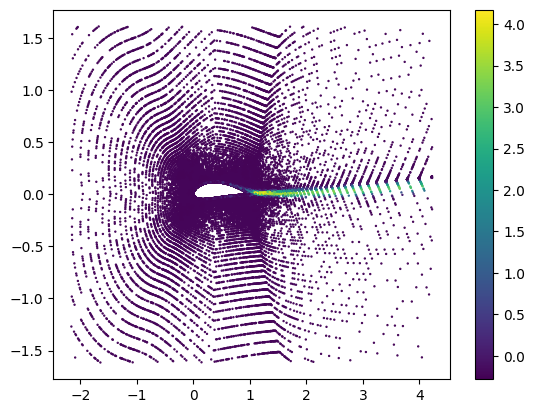

In [75]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_dist.mean(0)[..., 3].cpu().detach(), s=0.5)
plt.colorbar()

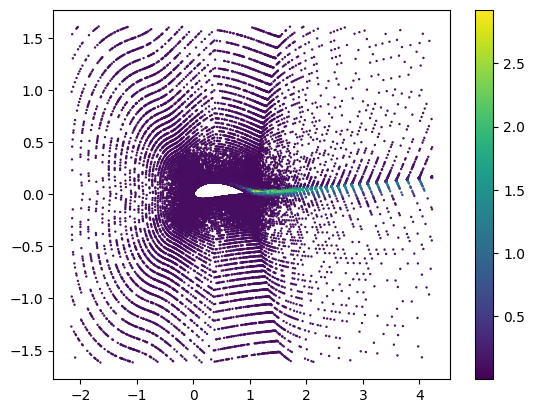

In [74]:
plt.scatter(graph.pos.cpu().detach()[..., 0], graph.pos.cpu().detach()[..., 1], c=pred_dist.std(0)[..., 3].cpu().detach(), s=0.5)
plt.colorbar()

# IV. add guidance to the unconditional

In [288]:
def guided_conditional_score_obs(ddpm, regressor, x, y, time, alpha_bar_t, coef_norm, weight=1):
    
    mu_x = coef_norm[0]
    std_x = coef_norm[1]
    
    mu_y = coef_norm[2]
    std_y = coef_norm[3]
    
    x = x.requires_grad_(True)
    base_score = ddpm(x, y, time)
    
    d = 10 + np.random.randn() * 0.1
    inlet_pos = torch.Tensor([-d, np.random.randn()* 0.1])
    inlet_sdf = (torch.Tensor([d]) - mean_sdf) / std_sdf
    p_inlet = torch.cat([inlet_pos, inlet_sdf], axis=-1).cuda()
    
    pred = inr_fields.modulated_forward(
        p_inlet.unsqueeze(0), x.unsqueeze(0) * sigma_fields + mu_fields).squeeze()
    
    inlet_x_hat = pred[0] * std_y[0] + mu_y[0]
    inlet_y_hat = pred[1] * std_y[1] + mu_y[1]
    
    inlet_x = y.squeeze()[-2] * std_y[0] + mu_y[0]
    inlet_y = y.squeeze()[-1] * std_y[1] + mu_y[1]
    
    log_p1 = -1/2*((inlet_x_hat/100 - inlet_x/100)**2 + (inlet_y_hat/100 - inlet_y/100)**2)
    log_p2 = -1/2*((regressor(x).squeeze()[:-2] - y.squeeze()[:-2])**2).mean()
    
    print('log_p1', log_p1.item())
    print('log_p2', log_p2.item())
    
    grad = torch.autograd.grad(log_p1 + log_p2, x)[0]
    score = base_score - weight * torch.sqrt(1 - alpha_bar_t) * grad
    
    return score

In [289]:
def guided_conditional_sample_ddpm_obs(ddpm, regressor, y, alpha, beta, alpha_bar, coef_norm, z_dim=256, steps=1000, total_steps=1000, weight=1):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.arange(0, total_steps).cuda()#torch.linspace(0, 1, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(1).cuda()
        else:
            eps = 0
            
        score = guided_conditional_score_obs(ddpm, regressor, z, y, time, alpha_bar[t], coef_norm, weight)
            
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*score) + torch.sqrt(beta[t])*eps
        
    return z

In [296]:
graph, idx = trainset.get(101)
graph = graph.cuda()

y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_y.unsqueeze(-1)], axis=-1)

In [297]:
z_sample = guided_conditional_sample_ddpm_obs(ddpm, reg, y, alpha, beta, alpha_bar, trainset.coef_norm, z_dim=256, steps=1000, total_steps=1000, weight=0)

log_p1 -0.18817035853862762
log_p2 -0.9783890843391418
log_p1 -0.16393661499023438
log_p2 -1.0274910926818848
log_p1 -0.17801809310913086
log_p2 -1.0187530517578125
log_p1 -0.17072054743766785
log_p2 -1.0102500915527344
log_p1 -0.18767166137695312
log_p2 -1.017638087272644
log_p1 -0.19505639374256134
log_p2 -0.9952904582023621
log_p1 -0.18467001616954803
log_p2 -0.9671679735183716
log_p1 -0.1828688681125641
log_p2 -1.0182530879974365
log_p1 -0.18380975723266602
log_p2 -1.0130938291549683
log_p1 -0.17918840050697327
log_p2 -1.0194021463394165
log_p1 -0.18383800983428955
log_p2 -0.9739008545875549
log_p1 -0.18539293110370636
log_p2 -0.9894423484802246
log_p1 -0.17743320763111115
log_p2 -0.9877802133560181
log_p1 -0.18162550032138824
log_p2 -0.9709556698799133
log_p1 -0.18383944034576416
log_p2 -0.9665643572807312
log_p1 -0.18246333301067352
log_p2 -0.9311902523040771
log_p1 -0.17525283992290497
log_p2 -0.909430742263794
log_p1 -0.1750955581665039
log_p2 -0.9401091933250427
log_p1 -0.1741

log_p1 -0.1682543307542801
log_p2 -0.898215651512146
log_p1 -0.1649690717458725
log_p2 -0.929969310760498
log_p1 -0.1578427255153656
log_p2 -0.93256676197052
log_p1 -0.16502203047275543
log_p2 -0.8596293926239014
log_p1 -0.16457416117191315
log_p2 -0.8111903071403503
log_p1 -0.16462498903274536
log_p2 -0.8510052561759949
log_p1 -0.17733734846115112
log_p2 -0.7812311053276062
log_p1 -0.1716311126947403
log_p2 -0.6772438287734985
log_p1 -0.16718623042106628
log_p2 -0.7047275304794312
log_p1 -0.16735804080963135
log_p2 -0.7026188373565674
log_p1 -0.17413462698459625
log_p2 -0.579303503036499
log_p1 -0.1691637635231018
log_p2 -0.5872511863708496
log_p1 -0.18306954205036163
log_p2 -0.456062912940979
log_p1 -0.17231494188308716
log_p2 -0.34071779251098633
log_p1 -0.16730183362960815
log_p2 -0.4982539713382721
log_p1 -0.17871321737766266
log_p2 -0.40823590755462646
log_p1 -0.17491908371448517
log_p2 -0.45327356457710266
log_p1 -0.1704075038433075
log_p2 -0.48775023221969604
log_p1 -0.16828255

log_p1 -0.15204265713691711
log_p2 -0.7496000528335571
log_p1 -0.16768379509449005
log_p2 -0.6728218793869019
log_p1 -0.15391188859939575
log_p2 -0.6087785959243774
log_p1 -0.1642284393310547
log_p2 -0.5131597518920898
log_p1 -0.15593045949935913
log_p2 -0.46710389852523804
log_p1 -0.1584859937429428
log_p2 -0.4808272123336792
log_p1 -0.15917983651161194
log_p2 -0.5130564570426941
log_p1 -0.16687040030956268
log_p2 -0.4962131977081299
log_p1 -0.1551561802625656
log_p2 -0.5052560567855835
log_p1 -0.15410985052585602
log_p2 -0.5583088994026184
log_p1 -0.163101464509964
log_p2 -0.5651023387908936
log_p1 -0.16401204466819763
log_p2 -0.602674663066864
log_p1 -0.15688784420490265
log_p2 -0.6614920496940613
log_p1 -0.1624298393726349
log_p2 -0.5997844934463501
log_p1 -0.15318663418293
log_p2 -0.5442806482315063
log_p1 -0.160848006606102
log_p2 -0.6760414242744446
log_p1 -0.14974677562713623
log_p2 -0.7054643630981445
log_p1 -0.15299925208091736
log_p2 -0.8080229759216309
log_p1 -0.16233178973

log_p1 -0.16493400931358337
log_p2 -0.07010175287723541
log_p1 -0.15200915932655334
log_p2 -0.06989466398954391
log_p1 -0.1508193463087082
log_p2 -0.07317198067903519
log_p1 -0.16165488958358765
log_p2 -0.06699718534946442
log_p1 -0.15985600650310516
log_p2 -0.06478434801101685
log_p1 -0.15270544588565826
log_p2 -0.07448764145374298
log_p1 -0.17803868651390076
log_p2 -0.08485320210456848
log_p1 -0.15981759130954742
log_p2 -0.06440839171409607
log_p1 -0.15345045924186707
log_p2 -0.05920178443193436
log_p1 -0.15092237293720245
log_p2 -0.06537217646837234
log_p1 -0.16468702256679535
log_p2 -0.06273405253887177
log_p1 -0.1527867317199707
log_p2 -0.06626349687576294
log_p1 -0.16394300758838654
log_p2 -0.06620306521654129
log_p1 -0.1616363525390625
log_p2 -0.06833014637231827
log_p1 -0.15107549726963043
log_p2 -0.07360946387052536
log_p1 -0.1497756540775299
log_p2 -0.07047051191329956
log_p1 -0.16303977370262146
log_p2 -0.06589052081108093
log_p1 -0.16256684064865112
log_p2 -0.06173359602689

log_p1 -0.12683223187923431
log_p2 -0.35428568720817566
log_p1 -0.12762118875980377
log_p2 -0.3477366268634796
log_p1 -0.12332139909267426
log_p2 -0.31033867597579956
log_p1 -0.12411186099052429
log_p2 -0.31484249234199524
log_p1 -0.14367777109146118
log_p2 -0.28975021839141846
log_p1 -0.1382448524236679
log_p2 -0.25681301951408386
log_p1 -0.12775450944900513
log_p2 -0.28961965441703796
log_p1 -0.12770837545394897
log_p2 -0.36119532585144043
log_p1 -0.13008908927440643
log_p2 -0.36110377311706543
log_p1 -0.1430330127477646
log_p2 -0.41412022709846497
log_p1 -0.12225712835788727
log_p2 -0.4190874397754669
log_p1 -0.11783839762210846
log_p2 -0.42292675375938416
log_p1 -0.1275835931301117
log_p2 -0.4444465637207031
log_p1 -0.14092127978801727
log_p2 -0.5127233862876892
log_p1 -0.13710612058639526
log_p2 -0.4923984408378601
log_p1 -0.12303207814693451
log_p2 -0.45603546500205994
log_p1 -0.12326277792453766
log_p2 -0.48279517889022827
log_p1 -0.132560133934021
log_p2 -0.4424291253089905
log

log_p1 -0.11580825597047806
log_p2 -1.5911264419555664
log_p1 -0.1166592538356781
log_p2 -1.548992395401001
log_p1 -0.10090319812297821
log_p2 -1.5606584548950195
log_p1 -0.1279849261045456
log_p2 -1.5811750888824463
log_p1 -0.13292008638381958
log_p2 -1.5930414199829102
log_p1 -0.10577907413244247
log_p2 -1.5542817115783691
log_p1 -0.09503071010112762
log_p2 -1.5672301054000854
log_p1 -0.09470551460981369
log_p2 -1.5797115564346313
log_p1 -0.09936690330505371
log_p2 -1.5680458545684814
log_p1 -0.10504711419343948
log_p2 -1.573569893836975
log_p1 -0.10985613614320755
log_p2 -1.6075224876403809
log_p1 -0.09822913259267807
log_p2 -1.632426142692566
log_p1 -0.09746316075325012
log_p2 -1.652789831161499
log_p1 -0.1130201444029808
log_p2 -1.6706944704055786
log_p1 -0.12064491957426071
log_p2 -1.6282670497894287
log_p1 -0.1270754039287567
log_p2 -1.581536054611206
log_p1 -0.11116135120391846
log_p2 -1.5409457683563232
log_p1 -0.12880156934261322
log_p2 -1.554494023323059
log_p1 -0.1103082001

log_p1 -0.10301224887371063
log_p2 -0.7195000052452087
log_p1 -0.11186584085226059
log_p2 -0.7413572669029236
log_p1 -0.10749823600053787
log_p2 -0.742820143699646
log_p1 -0.10904937237501144
log_p2 -0.7314589023590088
log_p1 -0.11460456997156143
log_p2 -0.7469284534454346
log_p1 -0.11589144915342331
log_p2 -0.7543038129806519
log_p1 -0.11486310511827469
log_p2 -0.7728453278541565
log_p1 -0.16160032153129578
log_p2 -0.7552543878555298
log_p1 -0.12167950719594955
log_p2 -0.7420029640197754
log_p1 -0.1060619205236435
log_p2 -0.7205638885498047
log_p1 -0.13573507964611053
log_p2 -0.6881101131439209
log_p1 -0.13676364719867706
log_p2 -0.702427864074707
log_p1 -0.10765299946069717
log_p2 -0.6665279865264893
log_p1 -0.10787356644868851
log_p2 -0.6654320955276489
log_p1 -0.11387310922145844
log_p2 -0.6626192331314087
log_p1 -0.11624015867710114
log_p2 -0.6681836843490601
log_p1 -0.11229009181261063
log_p2 -0.6215348243713379
log_p1 -0.1353686898946762
log_p2 -0.6134129762649536
log_p1 -0.1374

In [298]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )
    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

((pred - images)**2).mean(0)

tensor([0.4854, 0.8022, 6.9620, 1.0665], device='cuda:0')

In [191]:
# 5 Classifier-free guidance

In [22]:
from infinity.ddpm import ConditionalDDPM

ddpm_steps=1000 
T = ddpm_steps
beta = np.linspace(1e-4, 0.02, T)
alpha = 1 - beta
alpha_bar = torch.Tensor(np.cumprod(alpha))

alpha = torch.Tensor(alpha)
alpha_bar = torch.Tensor(alpha_bar)
beta = torch.Tensor(beta)

timestamps = torch.linspace(0, 1, T).cuda()

ddpm = ConditionalDDPM(in_channels=latent_dim,
             y_channels=256+2,
             embed_channels=128,
             hidden_channels=1024,
             out_channels=latent_dim,
             depth=3,
             droprate=0.3).cuda()

In [23]:
run_name_ddpm = "giddy-sky-1222" #"dutiful-wildflower-1154" #"lunar-pyramid-1156" #"dutiful-wildflower-1154"#"trim-bird-1152"# #"worldly-dawn-1150" #"comfy-frog-1148" #"resilient-vortex-1143"
path = f"/data/serrano/functa2functa/airfrans/{task}/model/{run_name_ddpm}.pt"
ddpm_input = torch.load(path)
ddpm.load_state_dict(ddpm_input['model'])
ddpm.eval()

ConditionalDDPM(
  (embedding): SinusoidalPosEmb()
  (lift): Linear(in_features=256, out_features=1024, bias=True)
  (project): Linear0(
    (linear): Linear(in_features=1282, out_features=256, bias=True)
  )
  (activation): SiLU()
  (layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  (residual_blocks): ModuleList(
    (0-2): 3 x ConditionalResMLPBlock(
      (linear1): Linear(in_features=1024, out_features=1024, bias=True)
      (linear2): Linear(in_features=258, out_features=1024, bias=True)
      (linear3): Linear(in_features=128, out_features=1024, bias=True)
      (linear0): Linear0(
        (linear): Linear(in_features=1024, out_features=1024, bias=True)
      )
      (layer_norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (layer_norm2): LayerNorm((258,), eps=1e-05, elementwise_affine=True)
      (layer_norm3): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.3, inplace=False)
      (activation): SiLU()
   

In [66]:
def free_guidance_sample_conditional_ddpm(model, y, alpha, beta, alpha_bar, z_dim=256, steps=1000, total_steps=1000, weight=1):
    z = torch.randn(z_dim).cuda()

    timestamps = torch.linspace(0, 1, total_steps).cuda()
    #timestamps = torch.arange(0, total_steps).cuda()
    
    for t in range(steps-1, 0, -1):
        
        time = timestamps[t].unsqueeze(0)
        
        if t > 1:
            eps = torch.randn(z_dim).cuda()
        else:
            eps = 0
        with torch.no_grad():
            score = (weight + 1)*model(z, y, time) - weight*model(z, torch.zeros_like(y), time)
        
        z = (alpha[t])**(-0.5)*(z - (1-alpha[t])*(1-alpha_bar[t])**(-0.5)*score) + torch.sqrt(beta[t])*eps
        
        # because of the mistake
        
        
        #z = (alpha[t])**(-0.5)*(z - (1-alpha[t])/(1-alpha_bar[t])*model(z, time) ) + beta[t]*eps

        
    return z

In [67]:
graph, idx = trainset.get(2)

In [61]:
sigma_fields = sigma_fields.cuda()
mu_fields = mu_fields.cuda()

In [62]:
graph = graph.cuda()
y = torch.cat([graph.z_sdf, graph.inlet_x.unsqueeze(-1), graph.inlet_x.unsqueeze(-1)], axis=-1)

In [65]:
z_sample = free_guidance_sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000, weight=1)

with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_sample * sigma_fields + mu_fields
    )
    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

print(((pred - images)**2).mean(0))

tensor([0.1162, 0.4011, 0.1958, 0.2743], device='cuda:0')


In [71]:
num_samples = 10
z_dist = torch.zeros(num_samples, 256)
pred_dist = torch.zeros(num_samples, 64000, 4)

for i in range(num_samples):
    z_sample = free_guidance_sample_conditional_ddpm(ddpm, y, alpha.cuda(), beta.cuda(), alpha_bar.cuda(), steps=1000, weight=4)
    z_dist[i] = z_sample.cpu().detach()

In [72]:
print(z_dist.mean(0))

tensor([-1.1093, -1.4864,  2.7494,  0.0888,  2.5545, -0.4195,  0.8192, -0.6902,
         0.4994, -1.1762,  0.2784, -2.9070, -1.4342,  0.2069, -0.3651, -0.5892,
        -0.2215,  1.0731,  0.8305,  1.5180, -0.0462,  0.8539,  0.5740, -0.3757,
         0.0068, -0.5840,  0.1946,  0.3638,  1.2053, -0.2120,  1.9531, -2.2593,
        -1.0374, -0.0667,  0.0732, -0.9921,  0.8952, -0.6855, -0.0399,  0.0622,
         0.4117, -0.3383, -0.0893, -0.9149,  0.0398, -1.2968, -0.7481,  1.2802,
        -0.4227, -0.5378,  0.1965,  1.3150, -1.0484,  0.3759,  0.9213, -1.4236,
         0.1726,  0.0591,  1.9489, -0.3073,  0.8840, -0.5915,  0.0195, -1.2415,
        -0.9726,  0.0143, -0.3672,  0.2579, -0.6968, -0.5529,  0.0597, -0.0632,
        -0.0359,  0.0907,  0.8730, -0.1154,  0.0370, -0.1392,  1.9992, -1.8280,
        -0.7103, -0.6233, -0.1680, -0.7459, -0.4284,  1.5221, -0.0243, -2.3404,
         0.7066,  0.4251,  0.2495,  1.5304,  2.1020,  1.7551, -0.7596,  0.8346,
        -0.3670,  1.5239,  0.4690, -1.30

In [73]:
print(z_dist.std(0))

tensor([0.5281, 0.6691, 2.4348, 0.9392, 2.2031, 0.4629, 0.9535, 0.8194, 1.1358,
        1.0152, 1.0278, 2.2406, 1.1985, 0.9730, 0.5273, 0.3885, 0.4268, 1.0193,
        1.2976, 1.2816, 0.6488, 0.7950, 1.1889, 0.6630, 0.7010, 0.4035, 0.6725,
        0.6103, 0.8772, 0.4366, 1.0100, 1.6540, 0.3548, 0.2769, 0.3823, 0.7623,
        0.6875, 1.1590, 0.9092, 1.2801, 1.3621, 1.0212, 0.8422, 1.3620, 1.4134,
        2.0596, 1.1942, 0.1833, 0.7202, 0.7626, 0.8678, 0.5817, 0.9864, 0.9830,
        1.0938, 1.3849, 0.7757, 0.8113, 0.8538, 0.3778, 0.9212, 0.5939, 0.5172,
        0.4338, 0.9354, 0.5690, 0.6026, 1.0444, 1.1163, 0.7959, 0.4623, 0.8286,
        1.0863, 0.4836, 1.7661, 0.8662, 0.6564, 0.3803, 1.0726, 1.2648, 0.7851,
        0.4593, 0.9642, 0.3712, 1.4450, 1.4032, 0.5284, 1.3181, 2.2878, 1.6044,
        0.6285, 0.4338, 1.1170, 0.7006, 0.3610, 0.8392, 0.4731, 0.9902, 0.2655,
        0.9987, 0.3260, 0.5674, 0.7817, 0.8797, 1.0334, 0.2942, 0.5541, 0.6909,
        1.0284, 0.8850, 0.9007, 0.7565, 

In [74]:
with torch.no_grad():
    graph = graph.cuda()
    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    pred = inr_fields.modulated_forward(
        pos, z_dist.mean(0).cuda().unsqueeze(0) * sigma_fields + mu_fields
    )
    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

print(((pred - images)**2).mean(0))

tensor([0.0331, 0.0116, 0.0064, 0.5810], device='cuda:0')
